**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings

In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints"
log_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

Checkpoints will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 12720), started 5 days, 10:32:15 ago. (Use '!kill 12720' to kill it.)

In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


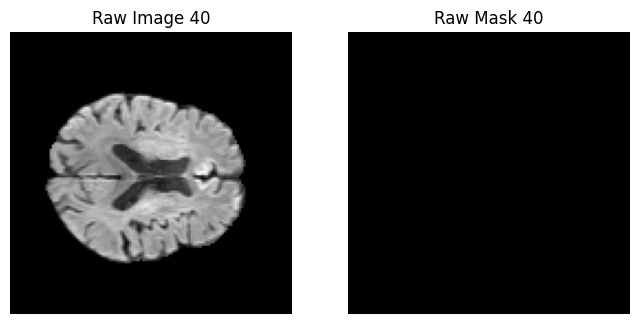

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


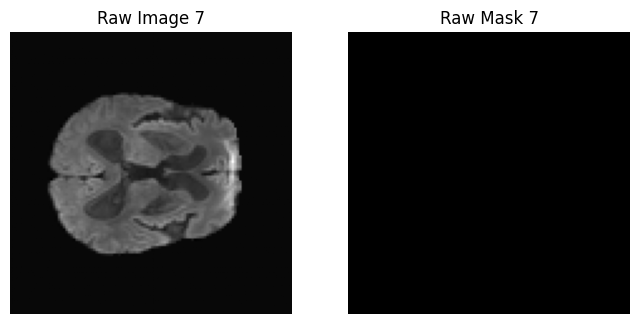

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


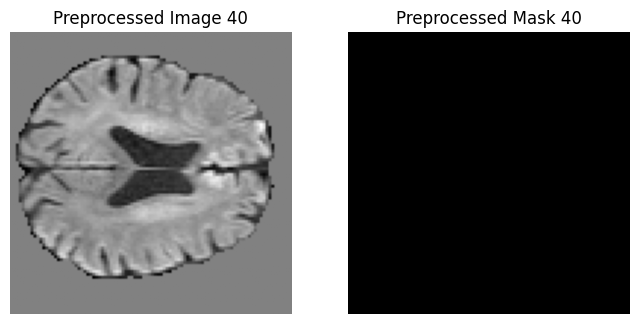

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


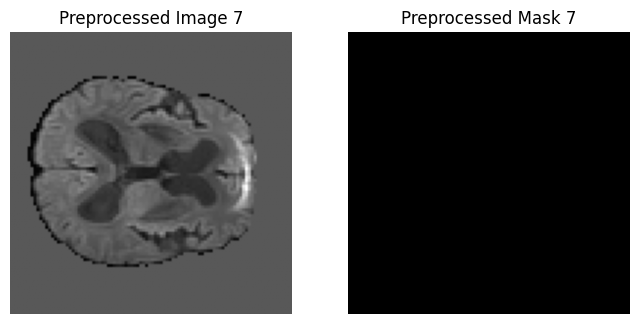

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


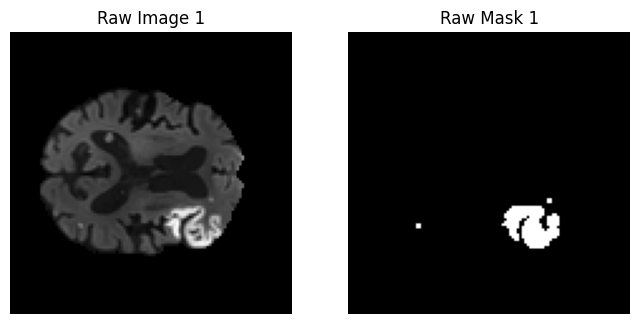

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


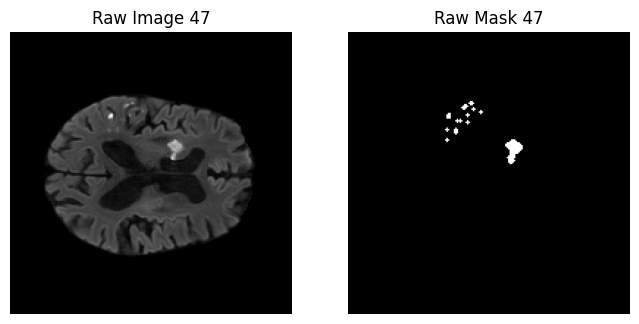

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


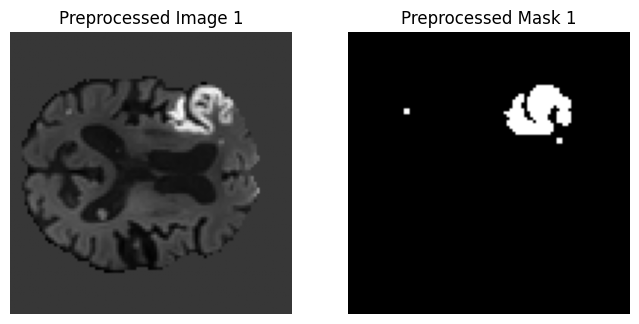

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


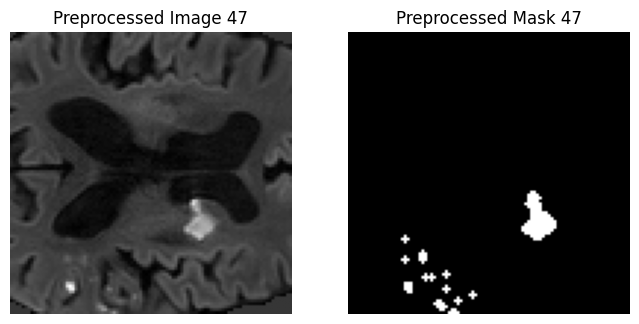

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


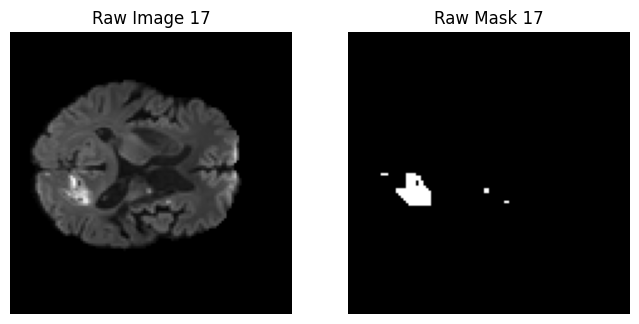

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


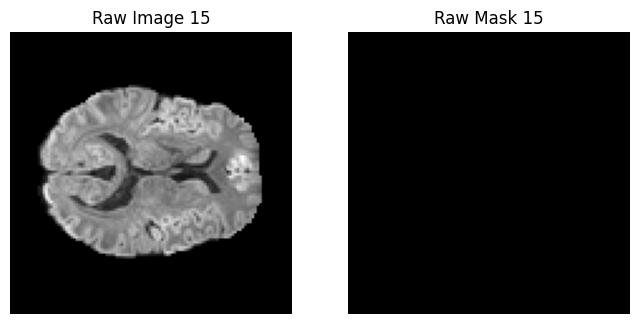

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


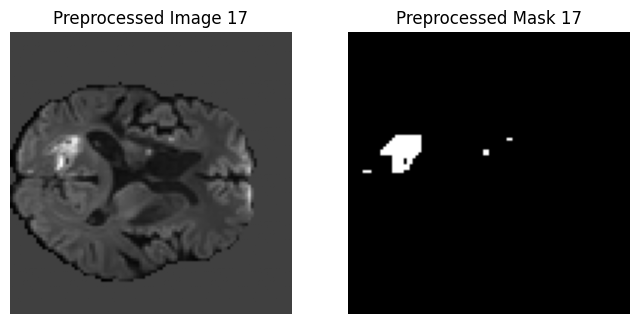

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


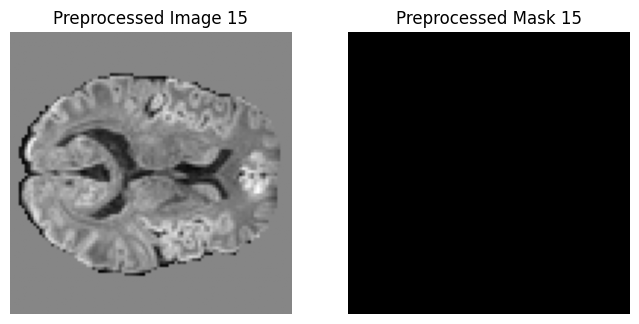

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


UNet

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
    print(model)
    return model

Using device: cuda:0


**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [ ]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9241 | Dice: 0.0094 | IoU: 0.0047 | HD95: 64.4132


Client 0 | Epoch 2/20 | Loss: 0.9098 | Dice: 0.0230 | IoU: 0.0116 | HD95: 54.1273


Client 0 | Epoch 3/20 | Loss: 0.9052 | Dice: 0.0286 | IoU: 0.0145 | HD95: 51.3721


Client 0 | Epoch 4/20 | Loss: 0.9023 | Dice: 0.0333 | IoU: 0.0169 | HD95: 48.6357


Client 0 | Epoch 5/20 | Loss: 0.8999 | Dice: 0.0370 | IoU: 0.0188 | HD95: 47.4770


Client 0 | Epoch 6/20 | Loss: 0.8979 | Dice: 0.0421 | IoU: 0.0215 | HD95: 45.7316


Client 0 | Epoch 7/20 | Loss: 0.8963 | Dice: 0.0478 | IoU: 0.0245 | HD95: 44.7965


Client 0 | Epoch 8/20 | Loss: 0.8950 | Dice: 0.0534 | IoU: 0.0274 | HD95: 43.9241


Client 0 | Epoch 9/20 | Loss: 0.8938 | Dice: 0.0586 | IoU: 0.0302 | HD95: 43.0857


Client 0 | Epoch 10/20 | Loss: 0.8926 | Dice: 0.0637 | IoU: 0.0329 | HD95: 42.7803


Client 0 | Epoch 11/20 | Loss: 0.8916 | Dice: 0.0687 | IoU: 0.0356 | HD95: 42.4811


Client 0 | Epoch 12/20 | Loss: 0.8907 | Dice: 0.0734 | IoU: 0.0381 | HD95: 42.2011


Client 0 | Epoch 13/20 | Loss: 0.8898 | Dice: 0.0782 | IoU: 0.0407 | HD95: 41.9878


Client 0 | Epoch 14/20 | Loss: 0.8890 | Dice: 0.0820 | IoU: 0.0427 | HD95: 41.6360


Client 0 | Epoch 15/20 | Loss: 0.8881 | Dice: 0.0863 | IoU: 0.0451 | HD95: 41.3945


Client 0 | Epoch 16/20 | Loss: 0.8873 | Dice: 0.0910 | IoU: 0.0477 | HD95: 41.1089


Client 0 | Epoch 17/20 | Loss: 0.8865 | Dice: 0.0957 | IoU: 0.0502 | HD95: 40.7417


Client 0 | Epoch 18/20 | Loss: 0.8858 | Dice: 0.0989 | IoU: 0.0520 | HD95: 40.5445


Client 0 | Epoch 19/20 | Loss: 0.8849 | Dice: 0.1032 | IoU: 0.0544 | HD95: 40.2939


Clients Training:  33%|███▎      | 1/3 [02:37<05:15, 157.74s/it]

Client 0 | Epoch 20/20 | Loss: 0.8842 | Dice: 0.1064 | IoU: 0.0562 | HD95: 40.0660
Client 0 | Loss=0.8947 | Dice=0.1064 | IoU=0.0562 | HD95=40.0660


Client 1 | Epoch 1/20 | Loss: 0.9246 | Dice: 0.0073 | IoU: 0.0037 | HD95: 61.3974


Client 1 | Epoch 2/20 | Loss: 0.9097 | Dice: 0.0193 | IoU: 0.0097 | HD95: 52.4592


Client 1 | Epoch 3/20 | Loss: 0.9048 | Dice: 0.0252 | IoU: 0.0128 | HD95: 48.5502


Client 1 | Epoch 4/20 | Loss: 0.9018 | Dice: 0.0306 | IoU: 0.0156 | HD95: 45.4046


Client 1 | Epoch 5/20 | Loss: 0.8995 | Dice: 0.0346 | IoU: 0.0176 | HD95: 43.6950


Client 1 | Epoch 6/20 | Loss: 0.8977 | Dice: 0.0394 | IoU: 0.0201 | HD95: 42.1519


Client 1 | Epoch 7/20 | Loss: 0.8963 | Dice: 0.0447 | IoU: 0.0229 | HD95: 40.8472


Client 1 | Epoch 8/20 | Loss: 0.8949 | Dice: 0.0509 | IoU: 0.0261 | HD95: 39.7858


Client 1 | Epoch 9/20 | Loss: 0.8938 | Dice: 0.0555 | IoU: 0.0285 | HD95: 39.2826


Client 1 | Epoch 10/20 | Loss: 0.8927 | Dice: 0.0613 | IoU: 0.0316 | HD95: 38.8690


Client 1 | Epoch 11/20 | Loss: 0.8918 | Dice: 0.0660 | IoU: 0.0341 | HD95: 38.6691


Client 1 | Epoch 12/20 | Loss: 0.8908 | Dice: 0.0719 | IoU: 0.0373 | HD95: 38.4201


Client 1 | Epoch 13/20 | Loss: 0.8899 | Dice: 0.0777 | IoU: 0.0404 | HD95: 38.1929


Client 1 | Epoch 14/20 | Loss: 0.8891 | Dice: 0.0826 | IoU: 0.0431 | HD95: 37.9383


Client 1 | Epoch 15/20 | Loss: 0.8883 | Dice: 0.0864 | IoU: 0.0452 | HD95: 37.8470


Client 1 | Epoch 16/20 | Loss: 0.8874 | Dice: 0.0931 | IoU: 0.0488 | HD95: 37.4602


Client 1 | Epoch 17/20 | Loss: 0.8866 | Dice: 0.0984 | IoU: 0.0517 | HD95: 37.2263


Client 1 | Epoch 18/20 | Loss: 0.8858 | Dice: 0.1044 | IoU: 0.0551 | HD95: 37.1069


Client 1 | Epoch 19/20 | Loss: 0.8850 | Dice: 0.1086 | IoU: 0.0574 | HD95: 36.7753


Clients Training:  67%|██████▋   | 2/3 [05:07<02:33, 153.08s/it]

Client 1 | Epoch 20/20 | Loss: 0.8843 | Dice: 0.1144 | IoU: 0.0607 | HD95: 36.6177
Client 1 | Loss=0.8947 | Dice=0.1144 | IoU=0.0607 | HD95=36.6177


Client 2 | Epoch 1/20 | Loss: 0.9229 | Dice: 0.0106 | IoU: 0.0053 | HD95: 62.9794


Client 2 | Epoch 2/20 | Loss: 0.9082 | Dice: 0.0274 | IoU: 0.0139 | HD95: 53.3556


Client 2 | Epoch 3/20 | Loss: 0.9035 | Dice: 0.0339 | IoU: 0.0172 | HD95: 49.9348


Client 2 | Epoch 4/20 | Loss: 0.9004 | Dice: 0.0414 | IoU: 0.0212 | HD95: 46.9688


Client 2 | Epoch 5/20 | Loss: 0.8980 | Dice: 0.0478 | IoU: 0.0245 | HD95: 45.7152


Client 2 | Epoch 6/20 | Loss: 0.8961 | Dice: 0.0558 | IoU: 0.0287 | HD95: 44.7209


Client 2 | Epoch 7/20 | Loss: 0.8947 | Dice: 0.0636 | IoU: 0.0328 | HD95: 43.8625


Client 2 | Epoch 8/20 | Loss: 0.8932 | Dice: 0.0718 | IoU: 0.0372 | HD95: 43.3346


Client 2 | Epoch 9/20 | Loss: 0.8922 | Dice: 0.0791 | IoU: 0.0412 | HD95: 42.6331


Client 2 | Epoch 10/20 | Loss: 0.8910 | Dice: 0.0867 | IoU: 0.0453 | HD95: 41.8243


Client 2 | Epoch 11/20 | Loss: 0.8899 | Dice: 0.0951 | IoU: 0.0499 | HD95: 41.3252


Client 2 | Epoch 12/20 | Loss: 0.8890 | Dice: 0.1028 | IoU: 0.0542 | HD95: 40.9979


Client 2 | Epoch 13/20 | Loss: 0.8881 | Dice: 0.1104 | IoU: 0.0584 | HD95: 40.7589


Client 2 | Epoch 14/20 | Loss: 0.8871 | Dice: 0.1196 | IoU: 0.0636 | HD95: 40.5266


Client 2 | Epoch 15/20 | Loss: 0.8862 | Dice: 0.1280 | IoU: 0.0684 | HD95: 40.3625


Client 2 | Epoch 16/20 | Loss: 0.8853 | Dice: 0.1365 | IoU: 0.0732 | HD95: 40.1796


Client 2 | Epoch 17/20 | Loss: 0.8844 | Dice: 0.1454 | IoU: 0.0784 | HD95: 39.8586


Client 2 | Epoch 18/20 | Loss: 0.8837 | Dice: 0.1524 | IoU: 0.0825 | HD95: 39.8611


Client 2 | Epoch 19/20 | Loss: 0.8828 | Dice: 0.1643 | IoU: 0.0895 | HD95: 39.5723


Client 2 Epochs: 100%|██████████| 20/20 [02:30<00:00,  7.53s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8819 | Dice: 0.1730 | IoU: 0.0947 | HD95: 39.4077
Client 2 | Loss=0.8929 | Dice=0.1730 | IoU=0.0947 | HD95=39.4077


Best global model updated with Dice=0.0683
Global | Val Loss=0.8875 | Dice=0.0683 | IoU=0.0354 | HD95=43.3346
Checkpoint saved for round 1 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8838 | Dice: 0.1190 | IoU: 0.0632 | HD95: 39.7308


Client 0 | Epoch 2/20 | Loss: 0.8829 | Dice: 0.1227 | IoU: 0.0654 | HD95: 39.4676


Client 0 | Epoch 3/20 | Loss: 0.8821 | Dice: 0.1289 | IoU: 0.0689 | HD95: 39.2723


Client 0 | Epoch 4/20 | Loss: 0.8813 | Dice: 0.1302 | IoU: 0.0696 | HD95: 38.8399


Client 0 | Epoch 5/20 | Loss: 0.8805 | Dice: 0.1354 | IoU: 0.0726 | HD95: 38.8380


Client 0 | Epoch 6/20 | Loss: 0.8798 | Dice: 0.1326 | IoU: 0.0710 | HD95: 38.3126


Client 0 | Epoch 7/20 | Loss: 0.8788 | Dice: 0.1357 | IoU: 0.0728 | HD95: 40.0185


Client 0 | Epoch 8/20 | Loss: 0.8762 | Dice: 0.0974 | IoU: 0.0512 | HD95: 55.5469


Client 0 | Epoch 9/20 | Loss: 0.8626 | Dice: 0.0503 | IoU: 0.0258 | HD95: 63.9643


Client 0 | Epoch 10/20 | Loss: 0.8469 | Dice: 0.0600 | IoU: 0.0309 | HD95: 66.8597


Client 0 | Epoch 11/20 | Loss: 0.8343 | Dice: 0.0560 | IoU: 0.0288 | HD95: 68.0023


Client 0 | Epoch 12/20 | Loss: 0.8236 | Dice: 0.0555 | IoU: 0.0285 | HD95: 68.5723


Client 0 | Epoch 13/20 | Loss: 0.8140 | Dice: 0.0538 | IoU: 0.0277 | HD95: 69.3812


Client 0 | Epoch 14/20 | Loss: 0.8061 | Dice: 0.0530 | IoU: 0.0272 | HD95: 69.2925


Client 0 | Epoch 15/20 | Loss: 0.7987 | Dice: 0.0588 | IoU: 0.0303 | HD95: 69.0696


Client 0 | Epoch 16/20 | Loss: 0.7920 | Dice: 0.0567 | IoU: 0.0292 | HD95: 68.6496


Client 0 | Epoch 17/20 | Loss: 0.7859 | Dice: 0.0692 | IoU: 0.0358 | HD95: 68.3559


Client 0 | Epoch 18/20 | Loss: 0.7805 | Dice: 0.0688 | IoU: 0.0357 | HD95: 68.1862


Client 0 | Epoch 19/20 | Loss: 0.7755 | Dice: 0.0795 | IoU: 0.0414 | HD95: 67.0613


Clients Training:  33%|███▎      | 1/3 [02:32<05:04, 152.33s/it]

Client 0 | Epoch 20/20 | Loss: 0.7706 | Dice: 0.0891 | IoU: 0.0466 | HD95: 66.4036
Client 0 | Loss=0.8368 | Dice=0.0891 | IoU=0.0466 | HD95=66.4036


Client 1 | Epoch 1/20 | Loss: 0.8842 | Dice: 0.1106 | IoU: 0.0585 | HD95: 36.6778


Client 1 | Epoch 2/20 | Loss: 0.8833 | Dice: 0.1114 | IoU: 0.0590 | HD95: 36.4973


Client 1 | Epoch 3/20 | Loss: 0.8823 | Dice: 0.1193 | IoU: 0.0634 | HD95: 35.8296


Client 1 | Epoch 4/20 | Loss: 0.8814 | Dice: 0.1197 | IoU: 0.0637 | HD95: 35.8997


Client 1 | Epoch 5/20 | Loss: 0.8802 | Dice: 0.1135 | IoU: 0.0602 | HD95: 45.5574


Client 1 | Epoch 6/20 | Loss: 0.8699 | Dice: 0.0363 | IoU: 0.0185 | HD95: 61.0118


Client 1 | Epoch 7/20 | Loss: 0.8522 | Dice: 0.0472 | IoU: 0.0242 | HD95: 60.8660


Client 1 | Epoch 8/20 | Loss: 0.8377 | Dice: 0.0508 | IoU: 0.0261 | HD95: 63.0768


Client 1 | Epoch 9/20 | Loss: 0.8259 | Dice: 0.0472 | IoU: 0.0242 | HD95: 64.7114


Client 1 | Epoch 10/20 | Loss: 0.8158 | Dice: 0.0511 | IoU: 0.0262 | HD95: 65.4516


Client 1 | Epoch 11/20 | Loss: 0.8074 | Dice: 0.0487 | IoU: 0.0250 | HD95: 65.4996


Client 1 | Epoch 12/20 | Loss: 0.7993 | Dice: 0.0534 | IoU: 0.0274 | HD95: 65.6275


Client 1 | Epoch 13/20 | Loss: 0.7927 | Dice: 0.0580 | IoU: 0.0298 | HD95: 65.1814


Client 1 | Epoch 14/20 | Loss: 0.7862 | Dice: 0.0612 | IoU: 0.0316 | HD95: 64.8599


Client 1 | Epoch 15/20 | Loss: 0.7806 | Dice: 0.0699 | IoU: 0.0362 | HD95: 64.5689


Client 1 | Epoch 16/20 | Loss: 0.7757 | Dice: 0.0662 | IoU: 0.0343 | HD95: 64.0535


Client 1 | Epoch 17/20 | Loss: 0.7711 | Dice: 0.0667 | IoU: 0.0345 | HD95: 63.4483


Client 1 | Epoch 18/20 | Loss: 0.7663 | Dice: 0.0826 | IoU: 0.0431 | HD95: 62.8157


Client 1 | Epoch 19/20 | Loss: 0.7620 | Dice: 0.0856 | IoU: 0.0447 | HD95: 61.8334


Clients Training:  67%|██████▋   | 2/3 [05:15<02:38, 158.72s/it]

Client 1 | Epoch 20/20 | Loss: 0.7579 | Dice: 0.0958 | IoU: 0.0503 | HD95: 61.2538
Client 1 | Loss=0.8206 | Dice=0.0958 | IoU=0.0503 | HD95=61.2538


Client 2 | Epoch 1/20 | Loss: 0.8823 | Dice: 0.1474 | IoU: 0.0796 | HD95: 39.0987


Client 2 | Epoch 2/20 | Loss: 0.8813 | Dice: 0.1597 | IoU: 0.0868 | HD95: 38.7457


Client 2 | Epoch 3/20 | Loss: 0.8803 | Dice: 0.1697 | IoU: 0.0927 | HD95: 38.3343


Client 2 | Epoch 4/20 | Loss: 0.8796 | Dice: 0.1763 | IoU: 0.0967 | HD95: 38.2524


Client 2 | Epoch 5/20 | Loss: 0.8786 | Dice: 0.1940 | IoU: 0.1074 | HD95: 38.1293


Client 2 | Epoch 6/20 | Loss: 0.8793 | Dice: 0.1522 | IoU: 0.0824 | HD95: 39.4866


Client 2 | Epoch 7/20 | Loss: 0.8782 | Dice: 0.1712 | IoU: 0.0936 | HD95: 38.6792


Client 2 | Epoch 8/20 | Loss: 0.8774 | Dice: 0.1817 | IoU: 0.1000 | HD95: 38.3463


Client 2 | Epoch 9/20 | Loss: 0.8764 | Dice: 0.1916 | IoU: 0.1060 | HD95: 37.6287


Client 2 | Epoch 10/20 | Loss: 0.8755 | Dice: 0.1998 | IoU: 0.1110 | HD95: 37.7783


Client 2 | Epoch 11/20 | Loss: 0.8746 | Dice: 0.2105 | IoU: 0.1177 | HD95: 37.3651


Client 2 | Epoch 12/20 | Loss: 0.8737 | Dice: 0.2158 | IoU: 0.1209 | HD95: 37.6663


Client 2 | Epoch 13/20 | Loss: 0.8730 | Dice: 0.2190 | IoU: 0.1230 | HD95: 37.9134


Client 2 | Epoch 14/20 | Loss: 0.8722 | Dice: 0.2090 | IoU: 0.1167 | HD95: 37.0246


Client 2 | Epoch 15/20 | Loss: 0.8712 | Dice: 0.2163 | IoU: 0.1213 | HD95: 36.9887


Client 2 | Epoch 16/20 | Loss: 0.8702 | Dice: 0.2239 | IoU: 0.1260 | HD95: 37.0076


Client 2 | Epoch 17/20 | Loss: 0.8694 | Dice: 0.2315 | IoU: 0.1309 | HD95: 36.5904


Client 2 | Epoch 18/20 | Loss: 0.8685 | Dice: 0.2351 | IoU: 0.1332 | HD95: 36.6706


Client 2 | Epoch 19/20 | Loss: 0.8677 | Dice: 0.2408 | IoU: 0.1369 | HD95: 36.4362


Client 2 Epochs: 100%|██████████| 20/20 [01:58<00:00,  5.94s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.8669 | Dice: 0.2416 | IoU: 0.1374 | HD95: 36.4989
Client 2 | Loss=0.8748 | Dice=0.2416 | IoU=0.1374 | HD95=36.4989


Global | Val Loss=0.8058 | Dice=0.0325 | IoU=0.0165 | HD95=66.6329
Checkpoint saved for round 2 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round2.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7943 | Dice: 0.0704 | IoU: 0.0365 | HD95: 67.6908


Client 0 | Epoch 2/20 | Loss: 0.7876 | Dice: 0.0692 | IoU: 0.0358 | HD95: 67.9119


Client 0 | Epoch 3/20 | Loss: 0.7824 | Dice: 0.0687 | IoU: 0.0356 | HD95: 67.1585


Client 0 | Epoch 4/20 | Loss: 0.7772 | Dice: 0.0765 | IoU: 0.0398 | HD95: 67.5238


Client 0 | Epoch 5/20 | Loss: 0.7723 | Dice: 0.0834 | IoU: 0.0435 | HD95: 67.1225


Client 0 | Epoch 6/20 | Loss: 0.7673 | Dice: 0.0896 | IoU: 0.0469 | HD95: 67.1862


Client 0 | Epoch 7/20 | Loss: 0.7632 | Dice: 0.0917 | IoU: 0.0480 | HD95: 66.8824


Client 0 | Epoch 8/20 | Loss: 0.7591 | Dice: 0.1075 | IoU: 0.0568 | HD95: 65.7747


Client 0 | Epoch 9/20 | Loss: 0.7555 | Dice: 0.1097 | IoU: 0.0581 | HD95: 65.7104


Client 0 | Epoch 10/20 | Loss: 0.7508 | Dice: 0.1326 | IoU: 0.0710 | HD95: 65.0853


Client 0 | Epoch 11/20 | Loss: 0.7452 | Dice: 0.1812 | IoU: 0.0996 | HD95: 62.6649


Client 0 | Epoch 12/20 | Loss: 0.7399 | Dice: 0.2589 | IoU: 0.1487 | HD95: 64.2658


Client 0 | Epoch 13/20 | Loss: 0.7361 | Dice: 0.2776 | IoU: 0.1611 | HD95: 60.0087


Client 0 | Epoch 14/20 | Loss: 0.7327 | Dice: 0.2945 | IoU: 0.1727 | HD95: 59.6332


Client 0 | Epoch 15/20 | Loss: 0.7297 | Dice: 0.3082 | IoU: 0.1822 | HD95: 58.4201


Client 0 | Epoch 16/20 | Loss: 0.7266 | Dice: 0.3358 | IoU: 0.2018 | HD95: 55.4916


Client 0 | Epoch 17/20 | Loss: 0.7237 | Dice: 0.3672 | IoU: 0.2249 | HD95: 56.5130


Client 0 | Epoch 18/20 | Loss: 0.7208 | Dice: 0.3970 | IoU: 0.2476 | HD95: 56.5314


Client 0 | Epoch 19/20 | Loss: 0.7181 | Dice: 0.4233 | IoU: 0.2685 | HD95: 52.9840


Clients Training:  33%|███▎      | 1/3 [02:39<05:19, 159.71s/it]

Client 0 | Epoch 20/20 | Loss: 0.7155 | Dice: 0.4329 | IoU: 0.2762 | HD95: 50.3105
Client 0 | Loss=0.7499 | Dice=0.4329 | IoU=0.2762 | HD95=50.3105


Client 1 | Epoch 1/20 | Loss: 0.7944 | Dice: 0.0653 | IoU: 0.0337 | HD95: 63.4783


Client 1 | Epoch 2/20 | Loss: 0.7876 | Dice: 0.0681 | IoU: 0.0352 | HD95: 63.7442


Client 1 | Epoch 3/20 | Loss: 0.7819 | Dice: 0.0760 | IoU: 0.0395 | HD95: 63.7043


Client 1 | Epoch 4/20 | Loss: 0.7772 | Dice: 0.0782 | IoU: 0.0407 | HD95: 62.9980


Client 1 | Epoch 5/20 | Loss: 0.7722 | Dice: 0.0793 | IoU: 0.0413 | HD95: 62.9434


Client 1 | Epoch 6/20 | Loss: 0.7676 | Dice: 0.0874 | IoU: 0.0457 | HD95: 62.6303


Client 1 | Epoch 7/20 | Loss: 0.7636 | Dice: 0.0910 | IoU: 0.0477 | HD95: 62.2228


Client 1 | Epoch 8/20 | Loss: 0.7593 | Dice: 0.1076 | IoU: 0.0568 | HD95: 62.9578


Client 1 | Epoch 9/20 | Loss: 0.7533 | Dice: 0.1329 | IoU: 0.0712 | HD95: 63.5838


Client 1 | Epoch 10/20 | Loss: 0.7487 | Dice: 0.1899 | IoU: 0.1049 | HD95: 64.5416


Client 1 | Epoch 11/20 | Loss: 0.7433 | Dice: 0.2644 | IoU: 0.1523 | HD95: 62.2891


Client 1 | Epoch 12/20 | Loss: 0.7392 | Dice: 0.2821 | IoU: 0.1642 | HD95: 60.5869


Client 1 | Epoch 13/20 | Loss: 0.7358 | Dice: 0.2918 | IoU: 0.1708 | HD95: 59.9259


Client 1 | Epoch 14/20 | Loss: 0.7326 | Dice: 0.2991 | IoU: 0.1758 | HD95: 58.4117


Client 1 | Epoch 15/20 | Loss: 0.7292 | Dice: 0.3338 | IoU: 0.2003 | HD95: 56.1776


Client 1 | Epoch 16/20 | Loss: 0.7261 | Dice: 0.3395 | IoU: 0.2044 | HD95: 53.6497


Client 1 | Epoch 17/20 | Loss: 0.7231 | Dice: 0.3891 | IoU: 0.2415 | HD95: 52.1711


Client 1 | Epoch 18/20 | Loss: 0.7204 | Dice: 0.4010 | IoU: 0.2508 | HD95: 53.6127


Client 1 | Epoch 19/20 | Loss: 0.7178 | Dice: 0.4284 | IoU: 0.2726 | HD95: 50.8076


Clients Training:  67%|██████▋   | 2/3 [05:23<02:42, 162.38s/it]

Client 1 | Epoch 20/20 | Loss: 0.7150 | Dice: 0.4432 | IoU: 0.2847 | HD95: 48.0217
Client 1 | Loss=0.7494 | Dice=0.4432 | IoU=0.2847 | HD95=48.0217


Client 2 | Epoch 1/20 | Loss: 0.7911 | Dice: 0.0967 | IoU: 0.0508 | HD95: 65.8889


Client 2 | Epoch 2/20 | Loss: 0.7819 | Dice: 0.0997 | IoU: 0.0525 | HD95: 65.0164


Client 2 | Epoch 3/20 | Loss: 0.7743 | Dice: 0.1053 | IoU: 0.0556 | HD95: 64.7519


Client 2 | Epoch 4/20 | Loss: 0.7675 | Dice: 0.1193 | IoU: 0.0635 | HD95: 63.4974


Client 2 | Epoch 5/20 | Loss: 0.7616 | Dice: 0.1288 | IoU: 0.0688 | HD95: 63.0724


Client 2 | Epoch 6/20 | Loss: 0.7565 | Dice: 0.1423 | IoU: 0.0766 | HD95: 61.9383


Client 2 | Epoch 7/20 | Loss: 0.7519 | Dice: 0.1545 | IoU: 0.0837 | HD95: 59.7583


Client 2 | Epoch 8/20 | Loss: 0.7478 | Dice: 0.1645 | IoU: 0.0896 | HD95: 59.4997


Client 2 | Epoch 9/20 | Loss: 0.7442 | Dice: 0.1960 | IoU: 0.1087 | HD95: 58.8165


Client 2 | Epoch 10/20 | Loss: 0.7407 | Dice: 0.2211 | IoU: 0.1243 | HD95: 57.3557


Client 2 | Epoch 11/20 | Loss: 0.7374 | Dice: 0.2493 | IoU: 0.1424 | HD95: 56.7912


Client 2 | Epoch 12/20 | Loss: 0.7321 | Dice: 0.2241 | IoU: 0.1262 | HD95: 58.6284


Client 2 | Epoch 13/20 | Loss: 0.7274 | Dice: 0.2364 | IoU: 0.1340 | HD95: 55.9941


Client 2 | Epoch 14/20 | Loss: 0.7242 | Dice: 0.2447 | IoU: 0.1394 | HD95: 58.6825


Client 2 | Epoch 15/20 | Loss: 0.7212 | Dice: 0.2633 | IoU: 0.1516 | HD95: 57.6791


Client 2 | Epoch 16/20 | Loss: 0.7160 | Dice: 0.4242 | IoU: 0.2692 | HD95: 41.7850


Client 2 | Epoch 17/20 | Loss: 0.7118 | Dice: 0.4543 | IoU: 0.2939 | HD95: 40.5838


Client 2 | Epoch 18/20 | Loss: 0.7086 | Dice: 0.4589 | IoU: 0.2978 | HD95: 39.6745


Client 2 | Epoch 19/20 | Loss: 0.7053 | Dice: 0.4671 | IoU: 0.3047 | HD95: 37.7124


Client 2 Epochs: 100%|██████████| 20/20 [02:41<00:00,  8.07s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7026 | Dice: 0.4596 | IoU: 0.2984 | HD95: 37.1562
Client 2 | Loss=0.7402 | Dice=0.4596 | IoU=0.2984 | HD95=37.1562


Best global model updated with Dice=0.2984
Global | Val Loss=0.7255 | Dice=0.2984 | IoU=0.1754 | HD95=62.1116
Checkpoint saved for round 3 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7157 | Dice: 0.2553 | IoU: 0.1463 | HD95: 38.1136


Client 0 | Epoch 2/20 | Loss: 0.7167 | Dice: 0.2196 | IoU: 0.1234 | HD95: 40.4264


Client 0 | Epoch 3/20 | Loss: 0.7137 | Dice: 0.1895 | IoU: 0.1047 | HD95: 35.4681


Client 0 | Epoch 4/20 | Loss: 0.7076 | Dice: 0.2797 | IoU: 0.1626 | HD95: 34.9896


Client 0 | Epoch 5/20 | Loss: 0.7053 | Dice: 0.2735 | IoU: 0.1584 | HD95: 35.7408


Client 0 | Epoch 6/20 | Loss: 0.7018 | Dice: 0.3571 | IoU: 0.2174 | HD95: 44.0960


Client 0 | Epoch 7/20 | Loss: 0.6992 | Dice: 0.3547 | IoU: 0.2156 | HD95: 41.5389


Client 0 | Epoch 8/20 | Loss: 0.6961 | Dice: 0.4029 | IoU: 0.2523 | HD95: 47.8230


Client 0 | Epoch 9/20 | Loss: 0.6938 | Dice: 0.4038 | IoU: 0.2530 | HD95: 48.4561


Client 0 | Epoch 10/20 | Loss: 0.6913 | Dice: 0.4319 | IoU: 0.2754 | HD95: 49.9812


Client 0 | Epoch 11/20 | Loss: 0.6891 | Dice: 0.4290 | IoU: 0.2731 | HD95: 47.5376


Client 0 | Epoch 12/20 | Loss: 0.6869 | Dice: 0.4384 | IoU: 0.2808 | HD95: 45.5741


Client 0 | Epoch 13/20 | Loss: 0.6846 | Dice: 0.4398 | IoU: 0.2819 | HD95: 41.9347


Client 0 | Epoch 14/20 | Loss: 0.6826 | Dice: 0.4337 | IoU: 0.2769 | HD95: 43.3195


Client 0 | Epoch 15/20 | Loss: 0.6804 | Dice: 0.4381 | IoU: 0.2805 | HD95: 38.3672


Client 0 | Epoch 16/20 | Loss: 0.6781 | Dice: 0.4472 | IoU: 0.2880 | HD95: 35.8399


Client 0 | Epoch 17/20 | Loss: 0.6759 | Dice: 0.4439 | IoU: 0.2853 | HD95: 28.5561


Client 0 | Epoch 18/20 | Loss: 0.6738 | Dice: 0.4584 | IoU: 0.2973 | HD95: 29.0546


Client 0 | Epoch 19/20 | Loss: 0.6715 | Dice: 0.4582 | IoU: 0.2972 | HD95: 25.8432


Clients Training:  33%|███▎      | 1/3 [02:25<04:50, 145.39s/it]

Client 0 | Epoch 20/20 | Loss: 0.6695 | Dice: 0.4637 | IoU: 0.3018 | HD95: 15.1442
Client 0 | Loss=0.6917 | Dice=0.4637 | IoU=0.3018 | HD95=15.1442


Client 1 | Epoch 1/20 | Loss: 0.7161 | Dice: 0.2761 | IoU: 0.1601 | HD95: 41.3349


Client 1 | Epoch 2/20 | Loss: 0.7134 | Dice: 0.2893 | IoU: 0.1691 | HD95: 31.9938


Client 1 | Epoch 3/20 | Loss: 0.7147 | Dice: 0.2286 | IoU: 0.1290 | HD95: 31.9623


Client 1 | Epoch 4/20 | Loss: 0.7077 | Dice: 0.3132 | IoU: 0.1857 | HD95: 30.7295


Client 1 | Epoch 5/20 | Loss: 0.7040 | Dice: 0.3270 | IoU: 0.1954 | HD95: 33.5460


Client 1 | Epoch 6/20 | Loss: 0.7009 | Dice: 0.3775 | IoU: 0.2327 | HD95: 41.0261


Client 1 | Epoch 7/20 | Loss: 0.6982 | Dice: 0.3894 | IoU: 0.2418 | HD95: 39.9643


Client 1 | Epoch 8/20 | Loss: 0.6954 | Dice: 0.4156 | IoU: 0.2623 | HD95: 43.3491


Client 1 | Epoch 9/20 | Loss: 0.6933 | Dice: 0.4134 | IoU: 0.2606 | HD95: 39.6349


Client 1 | Epoch 10/20 | Loss: 0.6908 | Dice: 0.4380 | IoU: 0.2804 | HD95: 42.5740


Client 1 | Epoch 11/20 | Loss: 0.6882 | Dice: 0.4352 | IoU: 0.2781 | HD95: 40.5223


Client 1 | Epoch 12/20 | Loss: 0.6857 | Dice: 0.4368 | IoU: 0.2794 | HD95: 39.8481


Client 1 | Epoch 13/20 | Loss: 0.6833 | Dice: 0.4509 | IoU: 0.2911 | HD95: 39.0946


Client 1 | Epoch 14/20 | Loss: 0.6809 | Dice: 0.4607 | IoU: 0.2993 | HD95: 39.0619


Client 1 | Epoch 15/20 | Loss: 0.6785 | Dice: 0.4545 | IoU: 0.2941 | HD95: 32.2661


Client 1 | Epoch 16/20 | Loss: 0.6761 | Dice: 0.4739 | IoU: 0.3105 | HD95: 21.9805


Client 1 | Epoch 17/20 | Loss: 0.6737 | Dice: 0.4754 | IoU: 0.3118 | HD95: 19.6636


Client 1 | Epoch 18/20 | Loss: 0.6717 | Dice: 0.4686 | IoU: 0.3060 | HD95: 19.5598


Client 1 | Epoch 19/20 | Loss: 0.6694 | Dice: 0.4658 | IoU: 0.3036 | HD95: 10.9626


Clients Training:  67%|██████▋   | 2/3 [04:54<02:27, 147.32s/it]

Client 1 | Epoch 20/20 | Loss: 0.6679 | Dice: 0.4551 | IoU: 0.2946 | HD95: 12.4148
Client 1 | Loss=0.6905 | Dice=0.4551 | IoU=0.2946 | HD95=12.4148


Client 2 | Epoch 1/20 | Loss: 0.7072 | Dice: 0.3860 | IoU: 0.2392 | HD95: 36.8826


Client 2 | Epoch 2/20 | Loss: 0.7039 | Dice: 0.3959 | IoU: 0.2468 | HD95: 35.6182


Client 2 | Epoch 3/20 | Loss: 0.7007 | Dice: 0.4227 | IoU: 0.2680 | HD95: 37.8115


Client 2 | Epoch 4/20 | Loss: 0.6974 | Dice: 0.4247 | IoU: 0.2696 | HD95: 36.6543


Client 2 | Epoch 5/20 | Loss: 0.6949 | Dice: 0.4308 | IoU: 0.2745 | HD95: 38.3435


Client 2 | Epoch 6/20 | Loss: 0.6915 | Dice: 0.4501 | IoU: 0.2904 | HD95: 37.4800


Client 2 | Epoch 7/20 | Loss: 0.6885 | Dice: 0.4723 | IoU: 0.3091 | HD95: 38.2871


Client 2 | Epoch 8/20 | Loss: 0.6857 | Dice: 0.4629 | IoU: 0.3011 | HD95: 37.1519


Client 2 | Epoch 9/20 | Loss: 0.6830 | Dice: 0.4605 | IoU: 0.2991 | HD95: 37.2600


Client 2 | Epoch 10/20 | Loss: 0.6803 | Dice: 0.4615 | IoU: 0.3000 | HD95: 38.1890


Client 2 | Epoch 11/20 | Loss: 0.6777 | Dice: 0.4737 | IoU: 0.3104 | HD95: 41.3092


Client 2 | Epoch 12/20 | Loss: 0.6751 | Dice: 0.4631 | IoU: 0.3013 | HD95: 39.1640


Client 2 | Epoch 13/20 | Loss: 0.6726 | Dice: 0.4553 | IoU: 0.2947 | HD95: 36.3236


Client 2 | Epoch 14/20 | Loss: 0.6700 | Dice: 0.4632 | IoU: 0.3014 | HD95: 35.4268


Client 2 | Epoch 15/20 | Loss: 0.6673 | Dice: 0.4722 | IoU: 0.3091 | HD95: 27.7769


Client 2 | Epoch 16/20 | Loss: 0.6646 | Dice: 0.4722 | IoU: 0.3091 | HD95: 32.8275


Client 2 | Epoch 17/20 | Loss: 0.6608 | Dice: 0.4937 | IoU: 0.3278 | HD95: 36.4794


Client 2 | Epoch 18/20 | Loss: 0.6573 | Dice: 0.5008 | IoU: 0.3340 | HD95: 24.8464


Client 2 | Epoch 19/20 | Loss: 0.6544 | Dice: 0.5249 | IoU: 0.3558 | HD95: 19.1430


Client 2 Epochs: 100%|██████████| 20/20 [02:23<00:00,  7.18s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6519 | Dice: 0.5176 | IoU: 0.3492 | HD95: 17.2249
Client 2 | Loss=0.6792 | Dice=0.5176 | IoU=0.3492 | HD95=17.2249


Global | Val Loss=0.6943 | Dice=0.1947 | IoU=0.1078 | HD95=33.3976
Checkpoint saved for round 4 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round4.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6714 | Dice: 0.3358 | IoU: 0.2018 | HD95: 28.1907


Client 0 | Epoch 2/20 | Loss: 0.6696 | Dice: 0.3330 | IoU: 0.1998 | HD95: 27.2167


Client 0 | Epoch 3/20 | Loss: 0.6672 | Dice: 0.3411 | IoU: 0.2056 | HD95: 25.8153


Client 0 | Epoch 4/20 | Loss: 0.6621 | Dice: 0.3986 | IoU: 0.2489 | HD95: 22.9883


Client 0 | Epoch 5/20 | Loss: 0.6599 | Dice: 0.4229 | IoU: 0.2682 | HD95: 21.9425


Client 0 | Epoch 6/20 | Loss: 0.6560 | Dice: 0.4561 | IoU: 0.2954 | HD95: 14.2098


Client 0 | Epoch 7/20 | Loss: 0.6534 | Dice: 0.4586 | IoU: 0.2976 | HD95: 15.6968


Client 0 | Epoch 8/20 | Loss: 0.6510 | Dice: 0.4660 | IoU: 0.3038 | HD95: 12.9024


Client 0 | Epoch 9/20 | Loss: 0.6488 | Dice: 0.4764 | IoU: 0.3127 | HD95: 12.9985


Client 0 | Epoch 10/20 | Loss: 0.6463 | Dice: 0.4840 | IoU: 0.3192 | HD95: 11.8381


Client 0 | Epoch 11/20 | Loss: 0.6441 | Dice: 0.4838 | IoU: 0.3191 | HD95: 11.3075


Client 0 | Epoch 12/20 | Loss: 0.6417 | Dice: 0.4966 | IoU: 0.3303 | HD95: 12.3890


Client 0 | Epoch 13/20 | Loss: 0.6395 | Dice: 0.5032 | IoU: 0.3361 | HD95: 11.2348


Client 0 | Epoch 14/20 | Loss: 0.6374 | Dice: 0.4943 | IoU: 0.3283 | HD95: 12.0015


Client 0 | Epoch 15/20 | Loss: 0.6351 | Dice: 0.5141 | IoU: 0.3460 | HD95: 9.8555


Client 0 | Epoch 16/20 | Loss: 0.6329 | Dice: 0.5153 | IoU: 0.3470 | HD95: 9.5957


Client 0 | Epoch 17/20 | Loss: 0.6307 | Dice: 0.5252 | IoU: 0.3561 | HD95: 10.7238


Client 0 | Epoch 18/20 | Loss: 0.6287 | Dice: 0.5227 | IoU: 0.3539 | HD95: 8.0031


Client 0 | Epoch 19/20 | Loss: 0.6262 | Dice: 0.5200 | IoU: 0.3514 | HD95: 5.8494


Clients Training:  33%|███▎      | 1/3 [01:31<03:02, 91.26s/it]

Client 0 | Epoch 20/20 | Loss: 0.6236 | Dice: 0.5282 | IoU: 0.3589 | HD95: 4.5078
Client 0 | Loss=0.6463 | Dice=0.5282 | IoU=0.3589 | HD95=4.5078


Client 1 | Epoch 1/20 | Loss: 0.6711 | Dice: 0.3441 | IoU: 0.2078 | HD95: 23.2891


Client 1 | Epoch 2/20 | Loss: 0.6711 | Dice: 0.3056 | IoU: 0.1804 | HD95: 26.8414


Client 1 | Epoch 3/20 | Loss: 0.6637 | Dice: 0.4052 | IoU: 0.2540 | HD95: 20.5720


Client 1 | Epoch 4/20 | Loss: 0.6592 | Dice: 0.4383 | IoU: 0.2806 | HD95: 18.4302


Client 1 | Epoch 5/20 | Loss: 0.6557 | Dice: 0.4734 | IoU: 0.3101 | HD95: 11.6724


Client 1 | Epoch 6/20 | Loss: 0.6528 | Dice: 0.4801 | IoU: 0.3159 | HD95: 12.4678


Client 1 | Epoch 7/20 | Loss: 0.6500 | Dice: 0.4890 | IoU: 0.3236 | HD95: 10.5821


Client 1 | Epoch 8/20 | Loss: 0.6475 | Dice: 0.4947 | IoU: 0.3286 | HD95: 10.3623


Client 1 | Epoch 9/20 | Loss: 0.6448 | Dice: 0.4979 | IoU: 0.3315 | HD95: 9.8938


Client 1 | Epoch 10/20 | Loss: 0.6421 | Dice: 0.5043 | IoU: 0.3371 | HD95: 9.6234


Client 1 | Epoch 11/20 | Loss: 0.6394 | Dice: 0.5140 | IoU: 0.3459 | HD95: 9.6654


Client 1 | Epoch 12/20 | Loss: 0.6368 | Dice: 0.5219 | IoU: 0.3531 | HD95: 7.4136


Client 1 | Epoch 13/20 | Loss: 0.6343 | Dice: 0.5254 | IoU: 0.3563 | HD95: 7.5719


Client 1 | Epoch 14/20 | Loss: 0.6318 | Dice: 0.5353 | IoU: 0.3654 | HD95: 8.3738


Client 1 | Epoch 15/20 | Loss: 0.6295 | Dice: 0.5170 | IoU: 0.3486 | HD95: 7.0830


Client 1 | Epoch 16/20 | Loss: 0.6266 | Dice: 0.5231 | IoU: 0.3542 | HD95: 8.6916


Client 1 | Epoch 17/20 | Loss: 0.6237 | Dice: 0.5298 | IoU: 0.3604 | HD95: 5.0423


Client 1 | Epoch 18/20 | Loss: 0.6208 | Dice: 0.5399 | IoU: 0.3698 | HD95: 6.0598


Client 1 | Epoch 19/20 | Loss: 0.6182 | Dice: 0.5400 | IoU: 0.3699 | HD95: 4.9680


Clients Training:  67%|██████▋   | 2/3 [03:07<01:34, 94.40s/it]

Client 1 | Epoch 20/20 | Loss: 0.6167 | Dice: 0.5277 | IoU: 0.3584 | HD95: 9.4471
Client 1 | Loss=0.6418 | Dice=0.5277 | IoU=0.3584 | HD95=9.4471


Client 2 | Epoch 1/20 | Loss: 0.6600 | Dice: 0.3883 | IoU: 0.2409 | HD95: 26.5352


Client 2 | Epoch 2/20 | Loss: 0.6597 | Dice: 0.3579 | IoU: 0.2179 | HD95: 26.7805


Client 2 | Epoch 3/20 | Loss: 0.6529 | Dice: 0.4376 | IoU: 0.2801 | HD95: 21.0316


Client 2 | Epoch 4/20 | Loss: 0.6481 | Dice: 0.4776 | IoU: 0.3137 | HD95: 17.3036


Client 2 | Epoch 5/20 | Loss: 0.6443 | Dice: 0.4992 | IoU: 0.3326 | HD95: 14.8437


Client 2 | Epoch 6/20 | Loss: 0.6411 | Dice: 0.5049 | IoU: 0.3377 | HD95: 13.3210


Client 2 | Epoch 7/20 | Loss: 0.6379 | Dice: 0.5253 | IoU: 0.3562 | HD95: 12.4774


Client 2 | Epoch 8/20 | Loss: 0.6348 | Dice: 0.5413 | IoU: 0.3710 | HD95: 12.4435


Client 2 | Epoch 9/20 | Loss: 0.6319 | Dice: 0.5386 | IoU: 0.3686 | HD95: 10.1367


Client 2 | Epoch 10/20 | Loss: 0.6288 | Dice: 0.5394 | IoU: 0.3693 | HD95: 11.3737


Client 2 | Epoch 11/20 | Loss: 0.6259 | Dice: 0.5471 | IoU: 0.3766 | HD95: 11.6847


Client 2 | Epoch 12/20 | Loss: 0.6228 | Dice: 0.5432 | IoU: 0.3729 | HD95: 9.0505


Client 2 | Epoch 13/20 | Loss: 0.6196 | Dice: 0.5524 | IoU: 0.3816 | HD95: 10.0648


Client 2 | Epoch 14/20 | Loss: 0.6167 | Dice: 0.5511 | IoU: 0.3804 | HD95: 10.4784


Client 2 | Epoch 15/20 | Loss: 0.6135 | Dice: 0.5627 | IoU: 0.3915 | HD95: 7.4558


Client 2 | Epoch 16/20 | Loss: 0.6103 | Dice: 0.5604 | IoU: 0.3893 | HD95: 8.8345


Client 2 | Epoch 17/20 | Loss: 0.6094 | Dice: 0.5342 | IoU: 0.3645 | HD95: 11.1839


Client 2 | Epoch 18/20 | Loss: 0.6070 | Dice: 0.5304 | IoU: 0.3609 | HD95: 11.2064


Client 2 | Epoch 19/20 | Loss: 0.6019 | Dice: 0.5570 | IoU: 0.3860 | HD95: 8.6424


Client 2 Epochs: 100%|██████████| 20/20 [01:33<00:00,  4.69s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.5980 | Dice: 0.5729 | IoU: 0.4014 | HD95: 6.8748
Client 2 | Loss=0.6282 | Dice=0.5729 | IoU=0.4014 | HD95=6.8748


Best global model updated with Dice=0.4042
Global | Val Loss=0.6624 | Dice=0.4042 | IoU=0.2533 | HD95=21.1924
Checkpoint saved for round 5 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6277 | Dice: 0.4123 | IoU: 0.2597 | HD95: 20.7528


Client 0 | Epoch 2/20 | Loss: 0.6246 | Dice: 0.4148 | IoU: 0.2616 | HD95: 21.8061


Client 0 | Epoch 3/20 | Loss: 0.6177 | Dice: 0.5043 | IoU: 0.3372 | HD95: 14.1328


Client 0 | Epoch 4/20 | Loss: 0.6135 | Dice: 0.5324 | IoU: 0.3628 | HD95: 9.9632


Client 0 | Epoch 5/20 | Loss: 0.6106 | Dice: 0.5075 | IoU: 0.3401 | HD95: 10.5242


Client 0 | Epoch 6/20 | Loss: 0.6076 | Dice: 0.5373 | IoU: 0.3674 | HD95: 7.9363


Client 0 | Epoch 7/20 | Loss: 0.6044 | Dice: 0.5519 | IoU: 0.3811 | HD95: 5.5515


Client 0 | Epoch 8/20 | Loss: 0.6014 | Dice: 0.5526 | IoU: 0.3818 | HD95: 4.6231


Client 0 | Epoch 9/20 | Loss: 0.5987 | Dice: 0.5684 | IoU: 0.3970 | HD95: 3.9242


Client 0 | Epoch 10/20 | Loss: 0.5958 | Dice: 0.5677 | IoU: 0.3963 | HD95: 3.7123


Client 0 | Epoch 11/20 | Loss: 0.5938 | Dice: 0.5752 | IoU: 0.4037 | HD95: 3.8846


Client 0 | Epoch 12/20 | Loss: 0.5893 | Dice: 0.5652 | IoU: 0.3939 | HD95: 5.0718


Client 0 | Epoch 13/20 | Loss: 0.5834 | Dice: 0.5826 | IoU: 0.4110 | HD95: 4.8568


Client 0 | Epoch 14/20 | Loss: 0.5793 | Dice: 0.5827 | IoU: 0.4111 | HD95: 5.3964


Client 0 | Epoch 15/20 | Loss: 0.5760 | Dice: 0.5957 | IoU: 0.4242 | HD95: 4.8278


Client 0 | Epoch 16/20 | Loss: 0.5703 | Dice: 0.6051 | IoU: 0.4338 | HD95: 4.6621


Client 0 | Epoch 17/20 | Loss: 0.5655 | Dice: 0.6053 | IoU: 0.4340 | HD95: 5.7122


Client 0 | Epoch 18/20 | Loss: 0.5623 | Dice: 0.6064 | IoU: 0.4351 | HD95: 4.8380


Client 0 | Epoch 19/20 | Loss: 0.5580 | Dice: 0.6066 | IoU: 0.4354 | HD95: 4.1503


Clients Training:  33%|███▎      | 1/3 [01:01<02:03, 61.51s/it]

Client 0 | Epoch 20/20 | Loss: 0.5510 | Dice: 0.6203 | IoU: 0.4496 | HD95: 5.9187
Client 0 | Loss=0.5916 | Dice=0.6203 | IoU=0.4496 | HD95=5.9187


Client 1 | Epoch 1/20 | Loss: 0.6204 | Dice: 0.4586 | IoU: 0.2975 | HD95: 18.5438


Client 1 | Epoch 2/20 | Loss: 0.6205 | Dice: 0.4344 | IoU: 0.2774 | HD95: 20.7679


Client 1 | Epoch 3/20 | Loss: 0.6121 | Dice: 0.4895 | IoU: 0.3240 | HD95: 14.5841


Client 1 | Epoch 4/20 | Loss: 0.6066 | Dice: 0.5330 | IoU: 0.3633 | HD95: 9.1119


Client 1 | Epoch 5/20 | Loss: 0.6027 | Dice: 0.5448 | IoU: 0.3744 | HD95: 6.0319


Client 1 | Epoch 6/20 | Loss: 0.5991 | Dice: 0.5600 | IoU: 0.3889 | HD95: 5.8000


Client 1 | Epoch 7/20 | Loss: 0.5955 | Dice: 0.5730 | IoU: 0.4015 | HD95: 5.1207


Client 1 | Epoch 8/20 | Loss: 0.5922 | Dice: 0.5795 | IoU: 0.4079 | HD95: 5.8209


Client 1 | Epoch 9/20 | Loss: 0.5889 | Dice: 0.5867 | IoU: 0.4151 | HD95: 5.3988


Client 1 | Epoch 10/20 | Loss: 0.5857 | Dice: 0.5829 | IoU: 0.4113 | HD95: 5.5726


Client 1 | Epoch 11/20 | Loss: 0.5825 | Dice: 0.5892 | IoU: 0.4177 | HD95: 6.0552


Client 1 | Epoch 12/20 | Loss: 0.5790 | Dice: 0.5972 | IoU: 0.4258 | HD95: 4.9191


Client 1 | Epoch 13/20 | Loss: 0.5757 | Dice: 0.6022 | IoU: 0.4308 | HD95: 5.0441


Client 1 | Epoch 14/20 | Loss: 0.5707 | Dice: 0.6047 | IoU: 0.4334 | HD95: 6.4134


Client 1 | Epoch 15/20 | Loss: 0.5632 | Dice: 0.6119 | IoU: 0.4408 | HD95: 4.7868


Client 1 | Epoch 16/20 | Loss: 0.5593 | Dice: 0.6172 | IoU: 0.4463 | HD95: 5.9997


Client 1 | Epoch 17/20 | Loss: 0.5551 | Dice: 0.6128 | IoU: 0.4418 | HD95: 4.9574


Client 1 | Epoch 18/20 | Loss: 0.5479 | Dice: 0.6229 | IoU: 0.4524 | HD95: 5.3977


Client 1 | Epoch 19/20 | Loss: 0.5398 | Dice: 0.6389 | IoU: 0.4695 | HD95: 5.9673


Clients Training:  67%|██████▋   | 2/3 [02:06<01:03, 63.41s/it]

Client 1 | Epoch 20/20 | Loss: 0.5339 | Dice: 0.6437 | IoU: 0.4746 | HD95: 5.7978
Client 1 | Loss=0.5815 | Dice=0.6437 | IoU=0.4746 | HD95=5.7978


Client 2 | Epoch 1/20 | Loss: 0.6025 | Dice: 0.5275 | IoU: 0.3582 | HD95: 14.6959


Client 2 | Epoch 2/20 | Loss: 0.5980 | Dice: 0.5270 | IoU: 0.3578 | HD95: 11.8833


Client 2 | Epoch 3/20 | Loss: 0.5934 | Dice: 0.5498 | IoU: 0.3792 | HD95: 10.3318


Client 2 | Epoch 4/20 | Loss: 0.5897 | Dice: 0.5662 | IoU: 0.3949 | HD95: 7.6100


Client 2 | Epoch 5/20 | Loss: 0.5859 | Dice: 0.5754 | IoU: 0.4039 | HD95: 7.9881


Client 2 | Epoch 6/20 | Loss: 0.5825 | Dice: 0.5834 | IoU: 0.4118 | HD95: 8.9233


Client 2 | Epoch 7/20 | Loss: 0.5793 | Dice: 0.5756 | IoU: 0.4041 | HD95: 6.4176


Client 2 | Epoch 8/20 | Loss: 0.5758 | Dice: 0.5878 | IoU: 0.4163 | HD95: 6.2999


Client 2 | Epoch 9/20 | Loss: 0.5714 | Dice: 0.5956 | IoU: 0.4241 | HD95: 7.4066


Client 2 | Epoch 10/20 | Loss: 0.5674 | Dice: 0.6048 | IoU: 0.4335 | HD95: 7.8863


Client 2 | Epoch 11/20 | Loss: 0.5591 | Dice: 0.6113 | IoU: 0.4402 | HD95: 5.7353


Client 2 | Epoch 12/20 | Loss: 0.5540 | Dice: 0.6148 | IoU: 0.4438 | HD95: 6.1510


Client 2 | Epoch 13/20 | Loss: 0.5499 | Dice: 0.6204 | IoU: 0.4497 | HD95: 5.6209


Client 2 | Epoch 14/20 | Loss: 0.5455 | Dice: 0.6190 | IoU: 0.4482 | HD95: 6.4443


Client 2 | Epoch 15/20 | Loss: 0.5375 | Dice: 0.6218 | IoU: 0.4511 | HD95: 6.6572


Client 2 | Epoch 16/20 | Loss: 0.5292 | Dice: 0.6326 | IoU: 0.4626 | HD95: 5.5601


Client 2 | Epoch 17/20 | Loss: 0.5210 | Dice: 0.6396 | IoU: 0.4701 | HD95: 6.0721


Client 2 | Epoch 18/20 | Loss: 0.5172 | Dice: 0.6176 | IoU: 0.4467 | HD95: 7.5914


Client 2 | Epoch 19/20 | Loss: 0.5118 | Dice: 0.6292 | IoU: 0.4590 | HD95: 12.5037


Client 2 Epochs: 100%|██████████| 20/20 [01:03<00:00,  3.17s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.5042 | Dice: 0.6477 | IoU: 0.4789 | HD95: 7.4291
Client 2 | Loss=0.5588 | Dice=0.6477 | IoU=0.4789 | HD95=7.4291


Best global model updated with Dice=0.4703
Global | Val Loss=0.6113 | Dice=0.4703 | IoU=0.3074 | HD95=18.3906
Checkpoint saved for round 6 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5550 | Dice: 0.5514 | IoU: 0.3807 | HD95: 13.0941


Client 0 | Epoch 2/20 | Loss: 0.5745 | Dice: 0.3822 | IoU: 0.2363 | HD95: 30.7413


Client 0 | Epoch 3/20 | Loss: 0.5575 | Dice: 0.4438 | IoU: 0.2852 | HD95: 22.1886


Client 0 | Epoch 4/20 | Loss: 0.5377 | Dice: 0.5781 | IoU: 0.4066 | HD95: 15.2571


Client 0 | Epoch 5/20 | Loss: 0.5284 | Dice: 0.6002 | IoU: 0.4287 | HD95: 8.0460


Client 0 | Epoch 6/20 | Loss: 0.5209 | Dice: 0.6249 | IoU: 0.4545 | HD95: 6.0025


Client 0 | Epoch 7/20 | Loss: 0.5151 | Dice: 0.6391 | IoU: 0.4696 | HD95: 5.7269


Client 0 | Epoch 8/20 | Loss: 0.5093 | Dice: 0.6420 | IoU: 0.4727 | HD95: 5.4070


Client 0 | Epoch 9/20 | Loss: 0.5042 | Dice: 0.6528 | IoU: 0.4845 | HD95: 5.3418


Client 0 | Epoch 10/20 | Loss: 0.4992 | Dice: 0.6537 | IoU: 0.4855 | HD95: 5.4064


Client 0 | Epoch 11/20 | Loss: 0.4941 | Dice: 0.6653 | IoU: 0.4985 | HD95: 5.3127


Client 0 | Epoch 12/20 | Loss: 0.4884 | Dice: 0.6661 | IoU: 0.4993 | HD95: 5.3599


Client 0 | Epoch 13/20 | Loss: 0.4837 | Dice: 0.6777 | IoU: 0.5125 | HD95: 5.2660


Client 0 | Epoch 14/20 | Loss: 0.4783 | Dice: 0.6810 | IoU: 0.5164 | HD95: 5.2204


Client 0 | Epoch 15/20 | Loss: 0.4724 | Dice: 0.6946 | IoU: 0.5321 | HD95: 5.6410


Client 0 | Epoch 16/20 | Loss: 0.4682 | Dice: 0.6789 | IoU: 0.5139 | HD95: 5.2670


Client 0 | Epoch 17/20 | Loss: 0.4636 | Dice: 0.7060 | IoU: 0.5456 | HD95: 4.6041


Client 0 | Epoch 18/20 | Loss: 0.4588 | Dice: 0.6937 | IoU: 0.5310 | HD95: 4.7583


Client 0 | Epoch 19/20 | Loss: 0.4519 | Dice: 0.7078 | IoU: 0.5478 | HD95: 4.3980


Clients Training:  33%|███▎      | 1/3 [01:01<02:03, 62.00s/it]

Client 0 | Epoch 20/20 | Loss: 0.4462 | Dice: 0.7091 | IoU: 0.5493 | HD95: 4.3669
Client 0 | Loss=0.5004 | Dice=0.7091 | IoU=0.5493 | HD95=4.3669


Client 1 | Epoch 1/20 | Loss: 0.5384 | Dice: 0.5412 | IoU: 0.3710 | HD95: 13.3780


Client 1 | Epoch 2/20 | Loss: 0.5376 | Dice: 0.5446 | IoU: 0.3742 | HD95: 17.2805


Client 1 | Epoch 3/20 | Loss: 0.5267 | Dice: 0.5831 | IoU: 0.4116 | HD95: 11.0142


Client 1 | Epoch 4/20 | Loss: 0.5148 | Dice: 0.6027 | IoU: 0.4314 | HD95: 9.8512


Client 1 | Epoch 5/20 | Loss: 0.5059 | Dice: 0.6254 | IoU: 0.4549 | HD95: 8.1182


Client 1 | Epoch 6/20 | Loss: 0.4988 | Dice: 0.6598 | IoU: 0.4923 | HD95: 6.7908


Client 1 | Epoch 7/20 | Loss: 0.4918 | Dice: 0.6748 | IoU: 0.5092 | HD95: 6.4457


Client 1 | Epoch 8/20 | Loss: 0.4850 | Dice: 0.6798 | IoU: 0.5150 | HD95: 4.6585


Client 1 | Epoch 9/20 | Loss: 0.4791 | Dice: 0.6960 | IoU: 0.5338 | HD95: 4.5957


Client 1 | Epoch 10/20 | Loss: 0.4729 | Dice: 0.6946 | IoU: 0.5321 | HD95: 4.5639


Client 1 | Epoch 11/20 | Loss: 0.4673 | Dice: 0.7034 | IoU: 0.5425 | HD95: 4.6218


Client 1 | Epoch 12/20 | Loss: 0.4622 | Dice: 0.7100 | IoU: 0.5504 | HD95: 4.9580


Client 1 | Epoch 13/20 | Loss: 0.4570 | Dice: 0.7100 | IoU: 0.5504 | HD95: 4.4544


Client 1 | Epoch 14/20 | Loss: 0.4504 | Dice: 0.7119 | IoU: 0.5526 | HD95: 5.1124


Client 1 | Epoch 15/20 | Loss: 0.4438 | Dice: 0.7173 | IoU: 0.5592 | HD95: 4.6987


Client 1 | Epoch 16/20 | Loss: 0.4380 | Dice: 0.7335 | IoU: 0.5792 | HD95: 4.5232


Client 1 | Epoch 17/20 | Loss: 0.4316 | Dice: 0.7240 | IoU: 0.5674 | HD95: 4.9503


Client 1 | Epoch 18/20 | Loss: 0.4253 | Dice: 0.7410 | IoU: 0.5885 | HD95: 4.9598


Client 1 | Epoch 19/20 | Loss: 0.4194 | Dice: 0.7458 | IoU: 0.5946 | HD95: 4.3951


Clients Training:  67%|██████▋   | 2/3 [02:05<01:03, 63.05s/it]

Client 1 | Epoch 20/20 | Loss: 0.4148 | Dice: 0.7356 | IoU: 0.5817 | HD95: 4.7257
Client 1 | Loss=0.4730 | Dice=0.7356 | IoU=0.5817 | HD95=4.7257


Client 2 | Epoch 1/20 | Loss: 0.5110 | Dice: 0.6312 | IoU: 0.4612 | HD95: 10.3168


Client 2 | Epoch 2/20 | Loss: 0.5080 | Dice: 0.6112 | IoU: 0.4401 | HD95: 12.3726


Client 2 | Epoch 3/20 | Loss: 0.4980 | Dice: 0.6247 | IoU: 0.4542 | HD95: 8.4242


Client 2 | Epoch 4/20 | Loss: 0.4897 | Dice: 0.6327 | IoU: 0.4627 | HD95: 7.5805


Client 2 | Epoch 5/20 | Loss: 0.4822 | Dice: 0.6561 | IoU: 0.4882 | HD95: 6.6281


Client 2 | Epoch 6/20 | Loss: 0.4754 | Dice: 0.6657 | IoU: 0.4989 | HD95: 6.2876


Client 2 | Epoch 7/20 | Loss: 0.4694 | Dice: 0.6745 | IoU: 0.5089 | HD95: 6.1638


Client 2 | Epoch 8/20 | Loss: 0.4635 | Dice: 0.6845 | IoU: 0.5203 | HD95: 5.5732


Client 2 | Epoch 9/20 | Loss: 0.4584 | Dice: 0.6855 | IoU: 0.5215 | HD95: 5.6387


Client 2 | Epoch 10/20 | Loss: 0.4540 | Dice: 0.6855 | IoU: 0.5215 | HD95: 6.1293


Client 2 | Epoch 11/20 | Loss: 0.4478 | Dice: 0.6977 | IoU: 0.5357 | HD95: 5.4916


Client 2 | Epoch 12/20 | Loss: 0.4418 | Dice: 0.7030 | IoU: 0.5421 | HD95: 5.4731


Client 2 | Epoch 13/20 | Loss: 0.4362 | Dice: 0.7061 | IoU: 0.5457 | HD95: 6.0402


Client 2 | Epoch 14/20 | Loss: 0.4304 | Dice: 0.7205 | IoU: 0.5632 | HD95: 5.4497


Client 2 | Epoch 15/20 | Loss: 0.4257 | Dice: 0.7121 | IoU: 0.5530 | HD95: 4.4851


Client 2 | Epoch 16/20 | Loss: 0.4204 | Dice: 0.7182 | IoU: 0.5603 | HD95: 4.5510


Client 2 | Epoch 17/20 | Loss: 0.4151 | Dice: 0.7302 | IoU: 0.5750 | HD95: 5.3905


Client 2 | Epoch 18/20 | Loss: 0.4100 | Dice: 0.7329 | IoU: 0.5784 | HD95: 5.3765


Client 2 | Epoch 19/20 | Loss: 0.4049 | Dice: 0.7319 | IoU: 0.5771 | HD95: 5.3425


Client 2 Epochs: 100%|██████████| 20/20 [01:02<00:00,  3.12s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.4014 | Dice: 0.7348 | IoU: 0.5808 | HD95: 6.3478
Client 2 | Loss=0.4522 | Dice=0.7348 | IoU=0.5808 | HD95=6.3478


Best global model updated with Dice=0.4819
Global | Val Loss=0.5424 | Dice=0.4819 | IoU=0.3174 | HD95=19.4432
Checkpoint saved for round 7 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4525 | Dice: 0.6967 | IoU: 0.5346 | HD95: 5.9353


Client 0 | Epoch 2/20 | Loss: 0.4497 | Dice: 0.6576 | IoU: 0.4899 | HD95: 8.5984


Client 0 | Epoch 3/20 | Loss: 0.4387 | Dice: 0.6809 | IoU: 0.5162 | HD95: 6.5162


Client 0 | Epoch 4/20 | Loss: 0.4290 | Dice: 0.7137 | IoU: 0.5549 | HD95: 4.6567


Client 0 | Epoch 5/20 | Loss: 0.4229 | Dice: 0.7184 | IoU: 0.5605 | HD95: 4.5990


Client 0 | Epoch 6/20 | Loss: 0.4169 | Dice: 0.7193 | IoU: 0.5616 | HD95: 4.1303


Client 0 | Epoch 7/20 | Loss: 0.4114 | Dice: 0.7334 | IoU: 0.5791 | HD95: 4.4425


Client 0 | Epoch 8/20 | Loss: 0.4057 | Dice: 0.7455 | IoU: 0.5942 | HD95: 4.4417


Client 0 | Epoch 9/20 | Loss: 0.3994 | Dice: 0.7479 | IoU: 0.5973 | HD95: 4.4785


Client 0 | Epoch 10/20 | Loss: 0.3940 | Dice: 0.7552 | IoU: 0.6067 | HD95: 4.0244


Client 0 | Epoch 11/20 | Loss: 0.3876 | Dice: 0.7641 | IoU: 0.6182 | HD95: 4.4574


Client 0 | Epoch 12/20 | Loss: 0.3826 | Dice: 0.7775 | IoU: 0.6360 | HD95: 4.4329


Client 0 | Epoch 13/20 | Loss: 0.3783 | Dice: 0.7702 | IoU: 0.6263 | HD95: 4.3685


Client 0 | Epoch 14/20 | Loss: 0.3731 | Dice: 0.7816 | IoU: 0.6416 | HD95: 4.4152


Client 0 | Epoch 15/20 | Loss: 0.3692 | Dice: 0.7723 | IoU: 0.6291 | HD95: 4.4299


Client 0 | Epoch 16/20 | Loss: 0.3647 | Dice: 0.7743 | IoU: 0.6317 | HD95: 4.3622


Client 0 | Epoch 17/20 | Loss: 0.3574 | Dice: 0.7854 | IoU: 0.6466 | HD95: 4.3980


Client 0 | Epoch 18/20 | Loss: 0.3513 | Dice: 0.7945 | IoU: 0.6590 | HD95: 4.3598


Client 0 | Epoch 19/20 | Loss: 0.3454 | Dice: 0.8042 | IoU: 0.6725 | HD95: 4.3915


Clients Training:  33%|███▎      | 1/3 [01:00<02:00, 60.11s/it]

Client 0 | Epoch 20/20 | Loss: 0.3412 | Dice: 0.8073 | IoU: 0.6769 | HD95: 4.3818
Client 0 | Loss=0.3935 | Dice=0.8073 | IoU=0.6769 | HD95=4.3818


Client 1 | Epoch 1/20 | Loss: 0.4546 | Dice: 0.6087 | IoU: 0.4375 | HD95: 15.1291


Client 1 | Epoch 2/20 | Loss: 0.4443 | Dice: 0.6132 | IoU: 0.4422 | HD95: 14.9446


Client 1 | Epoch 3/20 | Loss: 0.4198 | Dice: 0.7015 | IoU: 0.5402 | HD95: 8.5463


Client 1 | Epoch 4/20 | Loss: 0.4085 | Dice: 0.7052 | IoU: 0.5446 | HD95: 6.8099


Client 1 | Epoch 5/20 | Loss: 0.4001 | Dice: 0.7289 | IoU: 0.5735 | HD95: 5.4423


Client 1 | Epoch 6/20 | Loss: 0.3923 | Dice: 0.7505 | IoU: 0.6006 | HD95: 4.9203


Client 1 | Epoch 7/20 | Loss: 0.3849 | Dice: 0.7547 | IoU: 0.6061 | HD95: 5.3084


Client 1 | Epoch 8/20 | Loss: 0.3780 | Dice: 0.7722 | IoU: 0.6289 | HD95: 5.2458


Client 1 | Epoch 9/20 | Loss: 0.3726 | Dice: 0.7708 | IoU: 0.6271 | HD95: 4.4816


Client 1 | Epoch 10/20 | Loss: 0.3672 | Dice: 0.7738 | IoU: 0.6310 | HD95: 4.4090


Client 1 | Epoch 11/20 | Loss: 0.3611 | Dice: 0.7810 | IoU: 0.6406 | HD95: 4.4230


Client 1 | Epoch 12/20 | Loss: 0.3554 | Dice: 0.7808 | IoU: 0.6404 | HD95: 4.4921


Client 1 | Epoch 13/20 | Loss: 0.3489 | Dice: 0.7908 | IoU: 0.6540 | HD95: 4.5905


Client 1 | Epoch 14/20 | Loss: 0.3433 | Dice: 0.8005 | IoU: 0.6674 | HD95: 4.3485


Client 1 | Epoch 15/20 | Loss: 0.3385 | Dice: 0.7987 | IoU: 0.6648 | HD95: 4.2688


Client 1 | Epoch 16/20 | Loss: 0.3346 | Dice: 0.7941 | IoU: 0.6585 | HD95: 4.2724


Client 1 | Epoch 17/20 | Loss: 0.3310 | Dice: 0.7995 | IoU: 0.6659 | HD95: 4.7161


Client 1 | Epoch 18/20 | Loss: 0.3250 | Dice: 0.8011 | IoU: 0.6682 | HD95: 4.2230


Client 1 | Epoch 19/20 | Loss: 0.3208 | Dice: 0.8015 | IoU: 0.6687 | HD95: 4.3308


Clients Training:  67%|██████▋   | 2/3 [02:03<01:02, 62.08s/it]

Client 1 | Epoch 20/20 | Loss: 0.3143 | Dice: 0.8116 | IoU: 0.6830 | HD95: 4.2521
Client 1 | Loss=0.3698 | Dice=0.8116 | IoU=0.6830 | HD95=4.2521


Client 2 | Epoch 1/20 | Loss: 0.4490 | Dice: 0.5618 | IoU: 0.3906 | HD95: 20.5101


Client 2 | Epoch 2/20 | Loss: 0.4429 | Dice: 0.5558 | IoU: 0.3849 | HD95: 17.9452


Client 2 | Epoch 3/20 | Loss: 0.4127 | Dice: 0.6619 | IoU: 0.4947 | HD95: 12.6288


Client 2 | Epoch 4/20 | Loss: 0.3959 | Dice: 0.6892 | IoU: 0.5258 | HD95: 8.0865


Client 2 | Epoch 5/20 | Loss: 0.3854 | Dice: 0.7131 | IoU: 0.5541 | HD95: 5.5050


Client 2 | Epoch 6/20 | Loss: 0.3778 | Dice: 0.7289 | IoU: 0.5734 | HD95: 5.7556


Client 2 | Epoch 7/20 | Loss: 0.3716 | Dice: 0.7390 | IoU: 0.5860 | HD95: 4.6412


Client 2 | Epoch 8/20 | Loss: 0.3673 | Dice: 0.7477 | IoU: 0.5971 | HD95: 4.4201


Client 2 | Epoch 9/20 | Loss: 0.3629 | Dice: 0.7483 | IoU: 0.5978 | HD95: 5.8078


Client 2 | Epoch 10/20 | Loss: 0.3576 | Dice: 0.7555 | IoU: 0.6070 | HD95: 5.1282


Client 2 | Epoch 11/20 | Loss: 0.3527 | Dice: 0.7614 | IoU: 0.6148 | HD95: 4.3916


Client 2 | Epoch 12/20 | Loss: 0.3479 | Dice: 0.7636 | IoU: 0.6176 | HD95: 4.3339


Client 2 | Epoch 13/20 | Loss: 0.3425 | Dice: 0.7735 | IoU: 0.6306 | HD95: 4.3152


Client 2 | Epoch 14/20 | Loss: 0.3381 | Dice: 0.7756 | IoU: 0.6335 | HD95: 4.3259


Client 2 | Epoch 15/20 | Loss: 0.3343 | Dice: 0.7762 | IoU: 0.6343 | HD95: 5.2372


Client 2 | Epoch 16/20 | Loss: 0.3302 | Dice: 0.7805 | IoU: 0.6400 | HD95: 4.2907


Client 2 | Epoch 17/20 | Loss: 0.3258 | Dice: 0.7858 | IoU: 0.6471 | HD95: 4.2549


Client 2 | Epoch 18/20 | Loss: 0.3201 | Dice: 0.7910 | IoU: 0.6542 | HD95: 4.2726


Client 2 | Epoch 19/20 | Loss: 0.3156 | Dice: 0.7948 | IoU: 0.6595 | HD95: 4.2739


Client 2 Epochs: 100%|██████████| 20/20 [01:03<00:00,  3.15s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.3111 | Dice: 0.8003 | IoU: 0.6671 | HD95: 4.2431
Client 2 | Loss=0.3621 | Dice=0.8003 | IoU=0.6671 | HD95=4.2431


Global | Val Loss=0.4819 | Dice=0.4799 | IoU=0.3157 | HD95=17.8137
Checkpoint saved for round 8 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round8.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3632 | Dice: 0.7347 | IoU: 0.5807 | HD95: 5.6014


Client 0 | Epoch 2/20 | Loss: 0.3697 | Dice: 0.7048 | IoU: 0.5442 | HD95: 6.5005


Client 0 | Epoch 3/20 | Loss: 0.3557 | Dice: 0.7316 | IoU: 0.5767 | HD95: 5.6646


Client 0 | Epoch 4/20 | Loss: 0.3415 | Dice: 0.7666 | IoU: 0.6216 | HD95: 4.9235


Client 0 | Epoch 5/20 | Loss: 0.3339 | Dice: 0.7720 | IoU: 0.6287 | HD95: 4.5165


Client 0 | Epoch 6/20 | Loss: 0.3274 | Dice: 0.7946 | IoU: 0.6592 | HD95: 4.0354


Client 0 | Epoch 7/20 | Loss: 0.3212 | Dice: 0.8067 | IoU: 0.6761 | HD95: 4.4508


Client 0 | Epoch 8/20 | Loss: 0.3144 | Dice: 0.8123 | IoU: 0.6839 | HD95: 4.3642


Client 0 | Epoch 9/20 | Loss: 0.3089 | Dice: 0.8165 | IoU: 0.6899 | HD95: 4.4253


Client 0 | Epoch 10/20 | Loss: 0.3031 | Dice: 0.8253 | IoU: 0.7025 | HD95: 4.3510


Client 0 | Epoch 11/20 | Loss: 0.3014 | Dice: 0.8169 | IoU: 0.6904 | HD95: 4.4218


Client 0 | Epoch 12/20 | Loss: 0.2980 | Dice: 0.8259 | IoU: 0.7035 | HD95: 4.3946


Client 0 | Epoch 13/20 | Loss: 0.2936 | Dice: 0.8196 | IoU: 0.6944 | HD95: 4.5041


Client 0 | Epoch 14/20 | Loss: 0.2893 | Dice: 0.8281 | IoU: 0.7066 | HD95: 4.4297


Client 0 | Epoch 15/20 | Loss: 0.2847 | Dice: 0.8317 | IoU: 0.7119 | HD95: 4.3661


Client 0 | Epoch 16/20 | Loss: 0.2793 | Dice: 0.8327 | IoU: 0.7134 | HD95: 4.3686


Client 0 | Epoch 17/20 | Loss: 0.2751 | Dice: 0.8423 | IoU: 0.7276 | HD95: 4.3675


Client 0 | Epoch 18/20 | Loss: 0.2701 | Dice: 0.8426 | IoU: 0.7281 | HD95: 4.3726


Client 0 | Epoch 19/20 | Loss: 0.2660 | Dice: 0.8484 | IoU: 0.7367 | HD95: 4.3251


Clients Training:  33%|███▎      | 1/3 [01:00<02:00, 60.38s/it]

Client 0 | Epoch 20/20 | Loss: 0.2614 | Dice: 0.8521 | IoU: 0.7424 | HD95: 4.3892
Client 0 | Loss=0.3079 | Dice=0.8521 | IoU=0.7424 | HD95=4.3892


Client 1 | Epoch 1/20 | Loss: 0.3303 | Dice: 0.7724 | IoU: 0.6292 | HD95: 4.6098


Client 1 | Epoch 2/20 | Loss: 0.3335 | Dice: 0.7278 | IoU: 0.5721 | HD95: 7.4129


Client 1 | Epoch 3/20 | Loss: 0.3281 | Dice: 0.7473 | IoU: 0.5966 | HD95: 7.3041


Client 1 | Epoch 4/20 | Loss: 0.3125 | Dice: 0.7785 | IoU: 0.6374 | HD95: 4.5026


Client 1 | Epoch 5/20 | Loss: 0.3023 | Dice: 0.8033 | IoU: 0.6713 | HD95: 4.7198


Client 1 | Epoch 6/20 | Loss: 0.2950 | Dice: 0.8104 | IoU: 0.6812 | HD95: 4.6399


Client 1 | Epoch 7/20 | Loss: 0.2894 | Dice: 0.8202 | IoU: 0.6952 | HD95: 4.6631


Client 1 | Epoch 8/20 | Loss: 0.2854 | Dice: 0.8198 | IoU: 0.6946 | HD95: 4.2205


Client 1 | Epoch 9/20 | Loss: 0.2820 | Dice: 0.8234 | IoU: 0.6998 | HD95: 4.0172


Client 1 | Epoch 10/20 | Loss: 0.2767 | Dice: 0.8299 | IoU: 0.7092 | HD95: 3.9673


Client 1 | Epoch 11/20 | Loss: 0.2697 | Dice: 0.8315 | IoU: 0.7116 | HD95: 3.9263


Client 1 | Epoch 12/20 | Loss: 0.2660 | Dice: 0.8446 | IoU: 0.7310 | HD95: 4.1022


Client 1 | Epoch 13/20 | Loss: 0.2611 | Dice: 0.8376 | IoU: 0.7206 | HD95: 3.8484


Client 1 | Epoch 14/20 | Loss: 0.2575 | Dice: 0.8481 | IoU: 0.7362 | HD95: 3.9298


Client 1 | Epoch 15/20 | Loss: 0.2526 | Dice: 0.8483 | IoU: 0.7366 | HD95: 3.7931


Client 1 | Epoch 16/20 | Loss: 0.2471 | Dice: 0.8576 | IoU: 0.7508 | HD95: 3.7750


Client 1 | Epoch 17/20 | Loss: 0.2439 | Dice: 0.8577 | IoU: 0.7509 | HD95: 3.7061


Client 1 | Epoch 18/20 | Loss: 0.2421 | Dice: 0.8524 | IoU: 0.7428 | HD95: 3.8600


Client 1 | Epoch 19/20 | Loss: 0.2389 | Dice: 0.8608 | IoU: 0.7556 | HD95: 3.7903


Clients Training:  67%|██████▋   | 2/3 [02:03<01:02, 62.02s/it]

Client 1 | Epoch 20/20 | Loss: 0.2351 | Dice: 0.8604 | IoU: 0.7550 | HD95: 3.7718
Client 1 | Loss=0.2775 | Dice=0.8604 | IoU=0.7550 | HD95=3.7718


Client 2 | Epoch 1/20 | Loss: 0.3211 | Dice: 0.7621 | IoU: 0.6157 | HD95: 5.6887


Client 2 | Epoch 2/20 | Loss: 0.3221 | Dice: 0.7182 | IoU: 0.5603 | HD95: 6.0537


Client 2 | Epoch 3/20 | Loss: 0.3136 | Dice: 0.7517 | IoU: 0.6022 | HD95: 5.2209


Client 2 | Epoch 4/20 | Loss: 0.3047 | Dice: 0.7611 | IoU: 0.6143 | HD95: 4.5257


Client 2 | Epoch 5/20 | Loss: 0.2976 | Dice: 0.7821 | IoU: 0.6422 | HD95: 4.4152


Client 2 | Epoch 6/20 | Loss: 0.2913 | Dice: 0.7901 | IoU: 0.6530 | HD95: 4.3079


Client 2 | Epoch 7/20 | Loss: 0.2855 | Dice: 0.8047 | IoU: 0.6732 | HD95: 4.2442


Client 2 | Epoch 8/20 | Loss: 0.2813 | Dice: 0.8096 | IoU: 0.6801 | HD95: 4.2415


Client 2 | Epoch 9/20 | Loss: 0.2770 | Dice: 0.8157 | IoU: 0.6887 | HD95: 4.2131


Client 2 | Epoch 10/20 | Loss: 0.2729 | Dice: 0.8137 | IoU: 0.6860 | HD95: 4.1972


Client 2 | Epoch 11/20 | Loss: 0.2710 | Dice: 0.8193 | IoU: 0.6939 | HD95: 4.1363


Client 2 | Epoch 12/20 | Loss: 0.2670 | Dice: 0.8232 | IoU: 0.6996 | HD95: 4.2663


Client 2 | Epoch 13/20 | Loss: 0.2616 | Dice: 0.8268 | IoU: 0.7048 | HD95: 4.4589


Client 2 | Epoch 14/20 | Loss: 0.2573 | Dice: 0.8396 | IoU: 0.7236 | HD95: 4.1307


Client 2 | Epoch 15/20 | Loss: 0.2536 | Dice: 0.8476 | IoU: 0.7355 | HD95: 4.0908


Client 2 | Epoch 16/20 | Loss: 0.2502 | Dice: 0.8464 | IoU: 0.7337 | HD95: 4.1558


Client 2 | Epoch 17/20 | Loss: 0.2461 | Dice: 0.8458 | IoU: 0.7329 | HD95: 4.0960


Client 2 | Epoch 18/20 | Loss: 0.2423 | Dice: 0.8601 | IoU: 0.7545 | HD95: 4.0374


Client 2 | Epoch 19/20 | Loss: 0.2387 | Dice: 0.8578 | IoU: 0.7510 | HD95: 4.0650


Client 2 Epochs: 100%|██████████| 20/20 [01:01<00:00,  3.09s/it]


Client 2 | Epoch 20/20 | Loss: 0.2348 | Dice: 0.8697 | IoU: 0.7695 | HD95: 4.0459
Client 2 | Loss=0.2745 | Dice=0.8697 | IoU=0.7695 | HD95=4.0459
Best global model updated with Dice=0.4884
Global | Val Loss=0.4347 | Dice=0.4884 | IoU=0.3231 | HD95=16.7481
Checkpoint saved for round 9 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2803 | Dice: 0.7905 | IoU: 0.6536 | HD95: 5.2058


Client 0 | Epoch 2/20 | Loss: 0.2931 | Dice: 0.7730 | IoU: 0.6300 | HD95: 6.3560


Client 0 | Epoch 3/20 | Loss: 0.2956 | Dice: 0.7598 | IoU: 0.6126 | HD95: 6.1602


Client 0 | Epoch 4/20 | Loss: 0.2848 | Dice: 0.7740 | IoU: 0.6314 | HD95: 6.6330


Client 0 | Epoch 5/20 | Loss: 0.2647 | Dice: 0.8115 | IoU: 0.6829 | HD95: 4.5002


Client 0 | Epoch 6/20 | Loss: 0.2551 | Dice: 0.8275 | IoU: 0.7057 | HD95: 4.4647


Client 0 | Epoch 7/20 | Loss: 0.2475 | Dice: 0.8446 | IoU: 0.7310 | HD95: 4.4086


Client 0 | Epoch 8/20 | Loss: 0.2417 | Dice: 0.8516 | IoU: 0.7415 | HD95: 4.4087


Client 0 | Epoch 9/20 | Loss: 0.2374 | Dice: 0.8536 | IoU: 0.7446 | HD95: 4.4051


Client 0 | Epoch 10/20 | Loss: 0.2330 | Dice: 0.8610 | IoU: 0.7560 | HD95: 4.3231


Client 0 | Epoch 11/20 | Loss: 0.2309 | Dice: 0.8563 | IoU: 0.7488 | HD95: 4.3479


Client 0 | Epoch 12/20 | Loss: 0.2284 | Dice: 0.8626 | IoU: 0.7584 | HD95: 4.3501


Client 0 | Epoch 13/20 | Loss: 0.2251 | Dice: 0.8631 | IoU: 0.7592 | HD95: 4.3047


Client 0 | Epoch 14/20 | Loss: 0.2252 | Dice: 0.8597 | IoU: 0.7540 | HD95: 4.3512


Client 0 | Epoch 15/20 | Loss: 0.2227 | Dice: 0.8586 | IoU: 0.7523 | HD95: 4.3306


Client 0 | Epoch 16/20 | Loss: 0.2223 | Dice: 0.8509 | IoU: 0.7405 | HD95: 4.3465


Client 0 | Epoch 17/20 | Loss: 0.2146 | Dice: 0.8634 | IoU: 0.7596 | HD95: 4.3187


Client 0 | Epoch 18/20 | Loss: 0.2105 | Dice: 0.8710 | IoU: 0.7714 | HD95: 4.2967


Client 0 | Epoch 19/20 | Loss: 0.2045 | Dice: 0.8763 | IoU: 0.7798 | HD95: 4.3380


Clients Training:  33%|███▎      | 1/3 [01:00<02:00, 60.02s/it]

Client 0 | Epoch 20/20 | Loss: 0.2007 | Dice: 0.8806 | IoU: 0.7867 | HD95: 4.2937
Client 0 | Loss=0.2409 | Dice=0.8806 | IoU=0.7867 | HD95=4.2937


Client 1 | Epoch 1/20 | Loss: 0.2529 | Dice: 0.8220 | IoU: 0.6977 | HD95: 4.7756


Client 1 | Epoch 2/20 | Loss: 0.2689 | Dice: 0.7658 | IoU: 0.6205 | HD95: 4.4727


Client 1 | Epoch 3/20 | Loss: 0.2755 | Dice: 0.7641 | IoU: 0.6182 | HD95: 7.1271


Client 1 | Epoch 4/20 | Loss: 0.2571 | Dice: 0.7847 | IoU: 0.6457 | HD95: 6.5092


Client 1 | Epoch 5/20 | Loss: 0.2365 | Dice: 0.8253 | IoU: 0.7026 | HD95: 4.1398


Client 1 | Epoch 6/20 | Loss: 0.2279 | Dice: 0.8420 | IoU: 0.7270 | HD95: 4.0557


Client 1 | Epoch 7/20 | Loss: 0.2206 | Dice: 0.8524 | IoU: 0.7428 | HD95: 3.9075


Client 1 | Epoch 8/20 | Loss: 0.2152 | Dice: 0.8603 | IoU: 0.7549 | HD95: 3.8312


Client 1 | Epoch 9/20 | Loss: 0.2103 | Dice: 0.8690 | IoU: 0.7683 | HD95: 3.8072


Client 1 | Epoch 10/20 | Loss: 0.2066 | Dice: 0.8719 | IoU: 0.7728 | HD95: 3.7748


Client 1 | Epoch 11/20 | Loss: 0.2034 | Dice: 0.8757 | IoU: 0.7789 | HD95: 3.7763


Client 1 | Epoch 12/20 | Loss: 0.2006 | Dice: 0.8745 | IoU: 0.7770 | HD95: 3.7724


Client 1 | Epoch 13/20 | Loss: 0.1963 | Dice: 0.8803 | IoU: 0.7862 | HD95: 3.7716


Client 1 | Epoch 14/20 | Loss: 0.1948 | Dice: 0.8839 | IoU: 0.7920 | HD95: 3.6943


Client 1 | Epoch 15/20 | Loss: 0.1897 | Dice: 0.8816 | IoU: 0.7882 | HD95: 3.7225


Client 1 | Epoch 16/20 | Loss: 0.1866 | Dice: 0.8925 | IoU: 0.8058 | HD95: 3.7028


Client 1 | Epoch 17/20 | Loss: 0.1896 | Dice: 0.8781 | IoU: 0.7826 | HD95: 3.7583


Client 1 | Epoch 18/20 | Loss: 0.1832 | Dice: 0.8867 | IoU: 0.7964 | HD95: 3.7441


Client 1 | Epoch 19/20 | Loss: 0.1783 | Dice: 0.8913 | IoU: 0.8039 | HD95: 3.7270


Clients Training:  67%|██████▋   | 2/3 [02:03<01:02, 62.11s/it]

Client 1 | Epoch 20/20 | Loss: 0.1754 | Dice: 0.8934 | IoU: 0.8073 | HD95: 3.6706
Client 1 | Loss=0.2135 | Dice=0.8934 | IoU=0.8073 | HD95=3.6706


Client 2 | Epoch 1/20 | Loss: 0.2549 | Dice: 0.7995 | IoU: 0.6660 | HD95: 4.8962


Client 2 | Epoch 2/20 | Loss: 0.2692 | Dice: 0.7651 | IoU: 0.6196 | HD95: 6.0795


Client 2 | Epoch 3/20 | Loss: 0.2562 | Dice: 0.7808 | IoU: 0.6404 | HD95: 4.9064


Client 2 | Epoch 4/20 | Loss: 0.2441 | Dice: 0.8062 | IoU: 0.6753 | HD95: 4.9050


Client 2 | Epoch 5/20 | Loss: 0.2346 | Dice: 0.8210 | IoU: 0.6963 | HD95: 4.1644


Client 2 | Epoch 6/20 | Loss: 0.2266 | Dice: 0.8441 | IoU: 0.7302 | HD95: 4.1385


Client 2 | Epoch 7/20 | Loss: 0.2215 | Dice: 0.8486 | IoU: 0.7370 | HD95: 4.1686


Client 2 | Epoch 8/20 | Loss: 0.2189 | Dice: 0.8559 | IoU: 0.7480 | HD95: 4.0714


Client 2 | Epoch 9/20 | Loss: 0.2164 | Dice: 0.8512 | IoU: 0.7409 | HD95: 4.1414


Client 2 | Epoch 10/20 | Loss: 0.2120 | Dice: 0.8597 | IoU: 0.7539 | HD95: 4.0872


Client 2 | Epoch 11/20 | Loss: 0.2083 | Dice: 0.8648 | IoU: 0.7618 | HD95: 4.0793


Client 2 | Epoch 12/20 | Loss: 0.2051 | Dice: 0.8691 | IoU: 0.7685 | HD95: 4.0634


Client 2 | Epoch 13/20 | Loss: 0.2003 | Dice: 0.8738 | IoU: 0.7758 | HD95: 4.0563


Client 2 | Epoch 14/20 | Loss: 0.1958 | Dice: 0.8882 | IoU: 0.7988 | HD95: 4.0149


Client 2 | Epoch 15/20 | Loss: 0.1935 | Dice: 0.8868 | IoU: 0.7966 | HD95: 4.0306


Client 2 | Epoch 16/20 | Loss: 0.1903 | Dice: 0.8902 | IoU: 0.8021 | HD95: 4.0126


Client 2 | Epoch 17/20 | Loss: 0.1879 | Dice: 0.8911 | IoU: 0.8035 | HD95: 4.0246


Client 2 | Epoch 18/20 | Loss: 0.1845 | Dice: 0.8935 | IoU: 0.8076 | HD95: 3.9894


Client 2 | Epoch 19/20 | Loss: 0.1846 | Dice: 0.8935 | IoU: 0.8075 | HD95: 4.0090


Client 2 Epochs: 100%|██████████| 20/20 [01:02<00:00,  3.14s/it]
                                                               

Client 2 | Epoch 20/20 | Loss: 0.1812 | Dice: 0.8974 | IoU: 0.8139 | HD95: 3.9878
Client 2 | Loss=0.2143 | Dice=0.8974 | IoU=0.8139 | HD95=3.9878


Global | Val Loss=0.4141 | Dice=0.4733 | IoU=0.3100 | HD95=15.8351
Checkpoint saved for round 10 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round10.pth
No significant Dice improvement for 1 round(s)


**Graph**

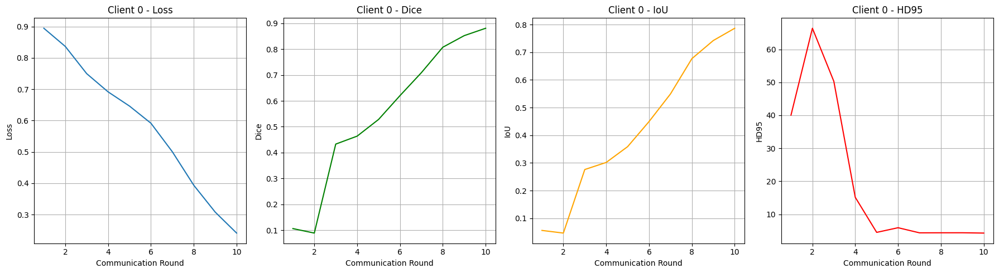

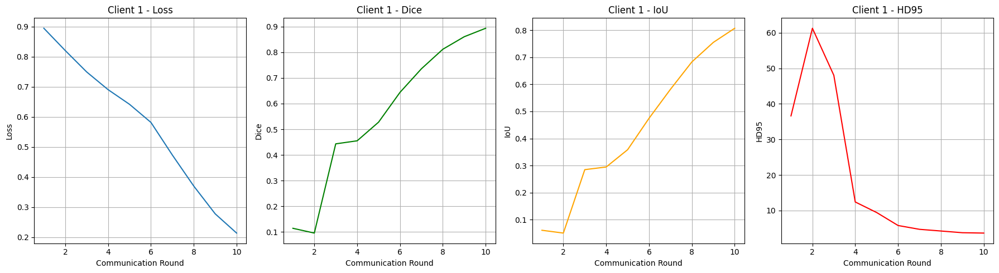

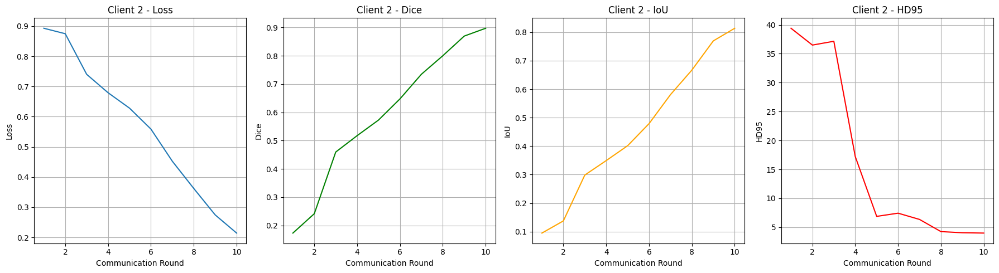

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

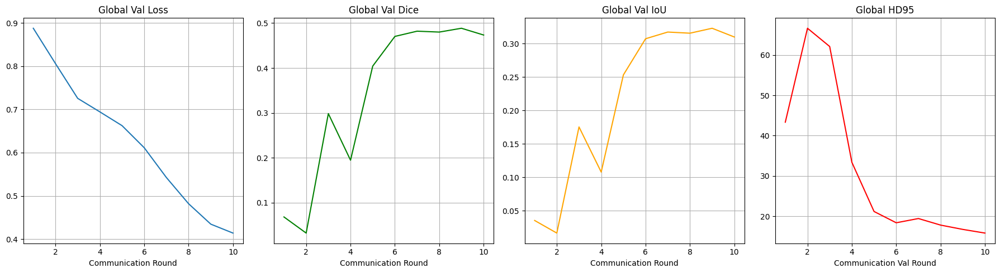

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1 Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_20228\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing:   0%|          | 0/50 [00:00<?, ?it/s]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  52%|█████▏    | 26/50 [00:01<00:01, 19.41it/s, Dice=0.3258, IoU=0.1946, HD95=20.4567]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  64%|██████▍   | 32/50 [00:01<00:00, 20.49it/s, Dice=0.3580, IoU=0.2180, HD95=19.1888]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:02<00:00, 19.33it/s, Dice=0.4496, IoU=0.2900, HD95=15.0672]


Test Set Metrics:
Dice: 0.4496
IoU: 0.2900
HD95: 15.0672


**Visualize**

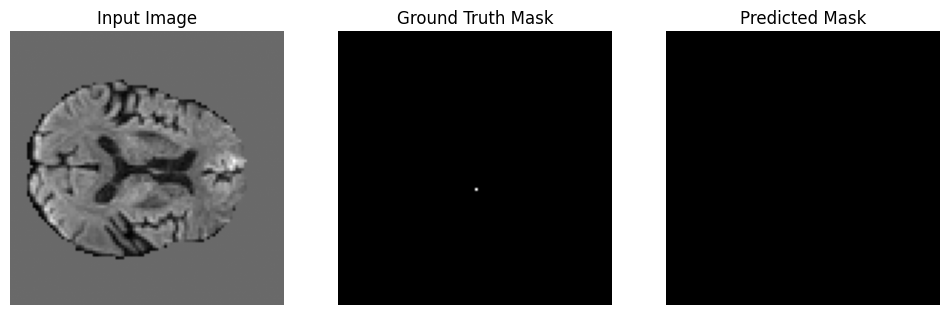

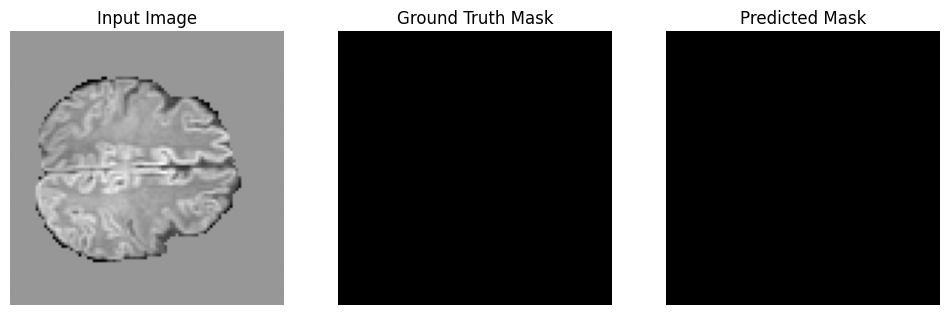

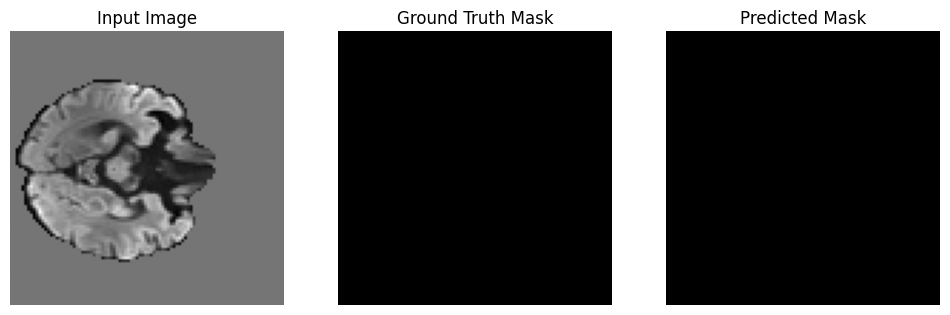

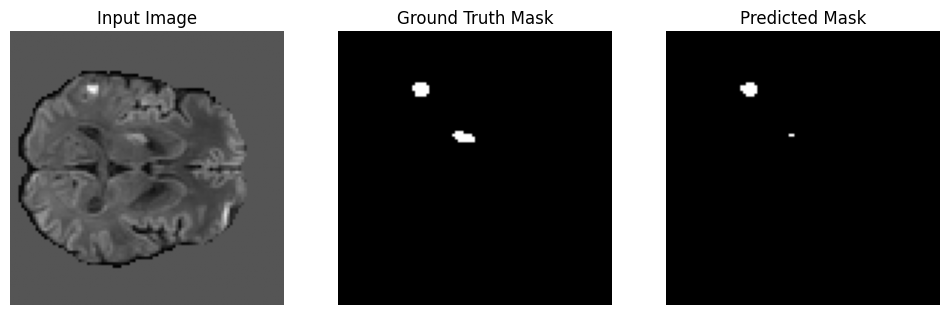

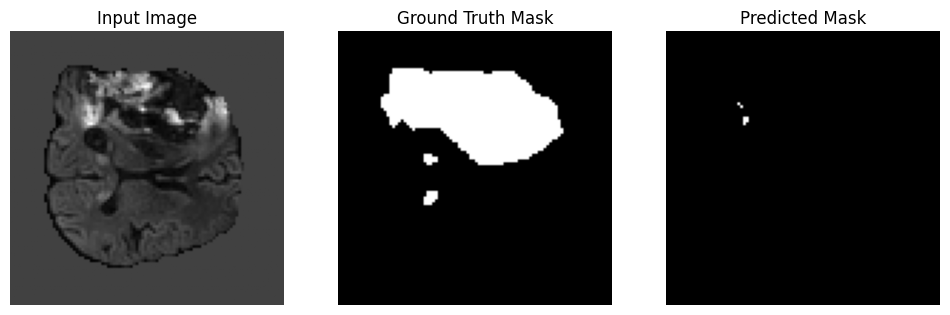

...

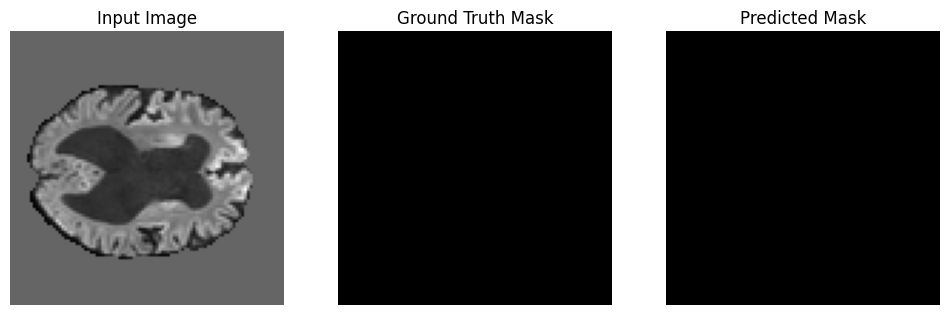

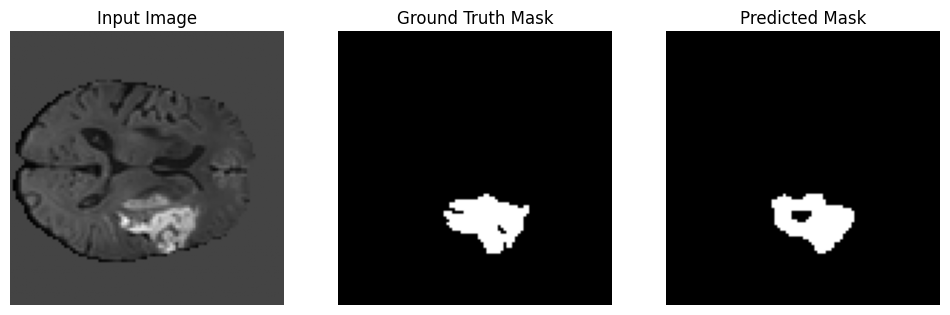

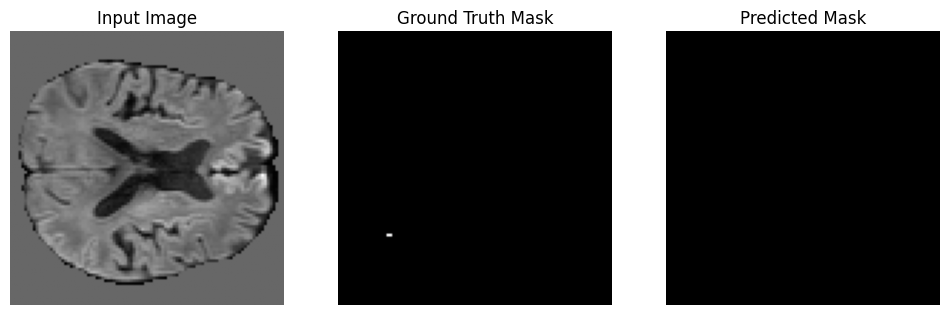

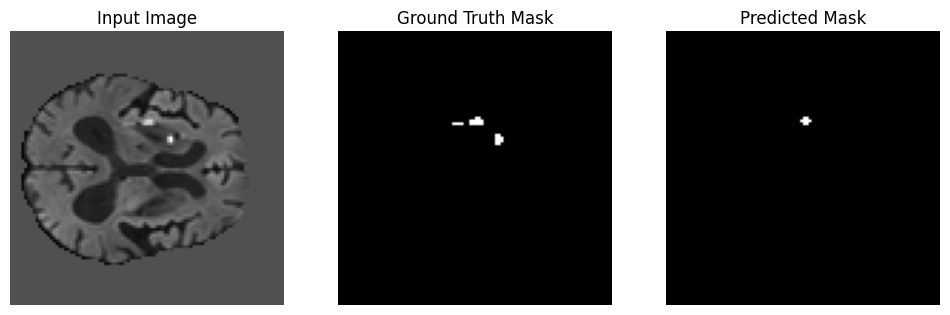

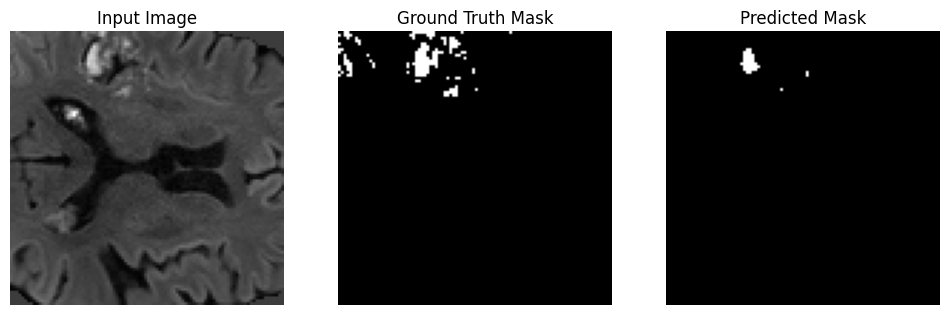

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()